## Imports

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader

from sklearn.manifold import TSNE

from utils.load_config import load_config
from utils.load_data import load_pkl

## Data preparation

### Data loading

In [15]:
# Define the paths for our data
cfg = load_config()
driams_pkl = cfg["data"]["DRIAMS_REDUCED_PKL"]
driams = load_pkl(driams_pkl)

In [16]:
data, label, meta = driams["data"], driams["label"], driams["meta"]
meta = pd.DataFrame.from_records(list(meta))

### Filter data and construct final dataset

In [17]:
maskA = np.where(meta["hospital"].values == "DRIAMS_A")[0]
dataA, labelA, metaA = data[maskA], label[maskA], meta.iloc[maskA]

maskD = np.where(meta["hospital"].values == "DRIAMS_D")[0]
dataD, labelD, metaD = data[maskD], label[maskD], meta.iloc[maskD]

In [18]:
# Downsample DRIAMS-A
from sklearn.model_selection import train_test_split

_, dataA_sub, _, labelA_sub, _, metaA_sub = train_test_split(
    dataA,
    labelA,
    metaA,
    test_size=len(dataD),
    random_state=42,
    stratify=labelA)

In [19]:
# Concatenate data and labels
data_final = np.vstack([dataA_sub, dataD])
label_final = np.concatenate([labelA_sub, labelD])
meta_final  = pd.concat([metaA_sub, metaD], ignore_index=True)

In [20]:
species, counts = np.unique(labelA_sub, return_counts=True)
for sp, n in zip(species, counts):
    print(f"{sp}: {n}")

Enterobacter_cloacae_complex: 676
Enterococcus_Faecium: 473
Escherichia_Coli: 1940
Klebsiella_Pneumoniae: 1073
Pseudomonas_Aeruginosa: 1290
Staphylococcus_Aureus: 1856


In [21]:
species, counts = np.unique(labelD, return_counts=True)
for sp, n in zip(species, counts):
    print(f"{sp}: {n}")

Enterobacter_cloacae_complex: 437
Enterococcus_Faecium: 171
Escherichia_Coli: 2013
Klebsiella_Pneumoniae: 2151
Pseudomonas_Aeruginosa: 362
Staphylococcus_Aureus: 2174


### Normalize each spectrum to [0, 1]

In [22]:
# Row-wise min-max normalization
data_norm = (data_final - data_final.min(axis=1, keepdims=True)) / (
    data_final.max(axis=1, keepdims=True) - data_final.min(axis=1, keepdims=True) + 1e-8
)

### Construct dataloaders

In [23]:
domain_map = {"DRIAMS_A": 0, "DRIAMS_D": 1}
domain_ids = meta_final["hospital"].map(domain_map).values

In [24]:
X_train, X_val, y_train, y_val, domain_train, domain_val = train_test_split(
    data_norm, label_final, domain_ids,
    test_size=0.2, random_state=42, stratify=label_final
)

In [25]:
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_val_tensor   = torch.tensor(X_val, dtype=torch.float32)
X_all_tensor = torch.tensor(data_norm, dtype=torch.float32)
domain_all_tensor = torch.tensor(domain_ids, dtype=torch.long)
domain_train_tensor = torch.tensor(domain_train, dtype=torch.long)
domain_val_tensor   = torch.tensor(domain_val, dtype=torch.long)

In [26]:
train_dataset = TensorDataset(X_train_tensor, domain_train_tensor)
val_dataset   = TensorDataset(X_val_tensor, domain_val_tensor)
all_dataset = TensorDataset(X_all_tensor, domain_all_tensor)

In [27]:
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=64, shuffle=False)
all_loader  = DataLoader(all_dataset, batch_size=256, shuffle=False)

## Util functions

In [13]:
def plot_model_metrics(model, model_name, save=False, path=None):
    """
    Plot training and validation losses for a VAE-like model.
    """
    train_losses = [t[0] for t in model.loss_during_training]
    train_recon = [t[0] for t in model.reconstruc_during_training]
    train_kl = [t[0] for t in model.KL_during_training]

    val_losses = [t[1] for t in model.loss_during_training]
    val_recon = [t[1] for t in model.reconstruc_during_training]
    val_kl = [t[1] for t in model.KL_during_training]

    epochs = range(1, len(train_losses) + 1)

    # Training
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_losses, label="Total loss", linewidth=2)
    plt.plot(epochs, train_recon, label="Reconstruction (MSE)", linestyle="--")
    plt.plot(epochs, train_kl, label="KL divergence", linestyle=":")
    plt.title(f"{model_name} Training Losses")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()

    if save and path:
      plt.savefig(path.replace(".png", "_train.png"),)
      plt.close()
    else:
      plt.show()

    # Validation
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, val_losses, label="Total loss", linewidth=2)
    plt.plot(epochs, val_recon, label="Reconstruction (MSE)", linestyle="--")
    plt.plot(epochs, val_kl, label="KL divergence", linestyle=":")
    plt.title(f"{model_name} Validation Losses")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()

    if save and path:
        plt.savefig(path.replace(".png", "_val.png"), dpi=300)
        plt.close()
    else:
        plt.show()


def compute_tsne_df(X, labels, metadata):
    """
    Compute global t-SNE embeddings for given samples.
    """
    tsne = TSNE(n_components=2, random_state=42)
    data_tsne = tsne.fit_transform(X)

    tsne_df = pd.DataFrame({
        "x": data_tsne[:, 0],
        "y": data_tsne[:, 1],
        "species": labels,
        "year": metadata["year"].values,
        "hospital": metadata["hospital"].values
    })

    return tsne_df


def plot_tsne_global(tsne_df, per_species=False, overlay_per_hospital=False, save=False, path=None):
    """
    Plot t-SNE embeddings globally (colored by species)
    or per species (colored by hospital).
    """

    # ----------- 1) GLOBAL VIEW (colored by species) -----------
    if not per_species and not overlay_per_hospital:
        plt.figure(figsize=(8, 6))
        for sp in sorted(tsne_df["species"].unique()):
            subset = tsne_df[tsne_df["species"] == sp]
            plt.scatter(subset["x"], subset["y"], s=10, alpha=0.25, label=sp)

        plt.title("t-SNE (colored by species)")
        plt.xlabel("t-SNE 1")
        plt.ylabel("t-SNE 2")
        plt.legend(title="Species", markerscale=2, loc="upper left",
                frameon=True, fontsize=8, title_fontsize=9)
        plt.tight_layout()

        if save and path:
            plt.savefig(path)
            plt.close()
        else:
            plt.show()

    # ----------- 2) PER SPECIES (colored by hospital) -----------
    elif per_species and not overlay_per_hospital:
        fig, axes = plt.subplots(2, 3, figsize=(18, 10), sharex=True, sharey=True)
        axes = axes.flatten()

        for i, sp in enumerate(sorted(tsne_df["species"].unique())):
            subset = tsne_df[tsne_df["species"] == sp]
            for hosp in tsne_df["hospital"].unique():
                sub_h = subset[subset["hospital"] == hosp]
                axes[i].scatter(sub_h["x"], sub_h["y"], s=10, alpha=0.25,
                                label=hosp if i == 0 else None)
            axes[i].set_title(sp.replace("_", " "), fontsize=15)
            axes[i].set_xticks([]); axes[i].set_yticks([])

        axes[0].legend(title="Hospital", loc="upper left",
                    frameon=True, fontsize=12, title_fontsize=13, markerscale=2.0)
        plt.suptitle("t-SNE embeddings per species (colored by hospital)", fontsize=18)
        plt.tight_layout(rect=[0, 0, 1, 0.95])

        if save and path:
            plt.savefig(path)
            plt.close()
        else:
            plt.show()

    # ----------- 3) PER SPECIES OVERLAY PER HOSPITAL -----------
    elif overlay_per_hospital:
        hospitals = sorted(tsne_df["hospital"].unique())

        for hosp_focus in hospitals:
            fig, axes = plt.subplots(2, 3, figsize=(18, 10), sharex=True, sharey=True)
            axes = axes.flatten()

            for i, sp in enumerate(sorted(tsne_df["species"].unique())):
                subset = tsne_df[tsne_df["species"] == sp]

                # background = all other hospitals
                background = subset[subset["hospital"] != hosp_focus]
                focus = subset[subset["hospital"] == hosp_focus]

                # plot background faintly
                axes[i].scatter(background["x"], background["y"], s=8, alpha=0.1, color="gray")

                # highlight focus hospital
                axes[i].scatter(focus["x"], focus["y"], s=12, alpha=0.5, color="red", label=hosp_focus)

                axes[i].set_title(sp.replace("_", " "), fontsize=15)
                axes[i].set_xticks([]); axes[i].set_yticks([])

            axes[0].legend(loc="upper left", fontsize=12, frameon=True)
            plt.suptitle(f"t-SNE per species — Highlighting {hosp_focus}", fontsize=18)
            plt.tight_layout(rect=[0, 0, 1, 0.95])

            if save and path:
                hosp_path = path.replace(".png", f"_{hosp_focus}.png")
                plt.savefig(hosp_path)
                plt.close()
            else:
                plt.show()


def compute_tsne_per_species(mus, labels, metadata):
    """
    Compute independent t-SNEs per species.
    """
    df_all = pd.DataFrame({
        "species": labels,
        "hospital": metadata["hospital"].values
    })
    for d in range(mus.shape[1]):
        df_all[f"z{d}"] = mus[:, d]

    tsne_results = {}
    for sp in sorted(np.unique(labels)):
        mask = (df_all["species"] == sp)
        X_sp = mus[mask]
        tsne = TSNE(n_components=2, random_state=42)
        X_tsne = tsne.fit_transform(X_sp)
        tsne_results[sp] = {
            "embedding": X_tsne,
            "hospital": df_all.loc[mask, "hospital"].values
        }

    return df_all, tsne_results


def plot_tsne_species(df_all, tsne_results, overlay_per_hospital=False, save=False, path=None):
    """
    Plot t-SNE embeddings computed independently for each species.
    If overlay=True, also creates one plot per hospital highlighting its samples.
    """
    import os
    import matplotlib.pyplot as plt

    species_sorted = sorted(tsne_results.keys())
    n_species = len(species_sorted)
    n_rows = (n_species + 2) // 3
    hospitals_sorted = sorted(df_all["hospital"].unique())

    # --- Plot per species (as before) ---
    if not overlay_per_hospital:
      fig, axes = plt.subplots(n_rows, 3, figsize=(18, 5 * n_rows),
                              sharex=True, sharey=True)
      axes = axes.flatten()

      for i, sp in enumerate(species_sorted):
          emb = tsne_results[sp]["embedding"]
          hosp = tsne_results[sp]["hospital"]
          for h in hospitals_sorted:
              idx = (hosp == h)
              axes[i].scatter(emb[idx, 0], emb[idx, 1], s=12, alpha=0.45,
                              label=h if i == 0 else None)
          axes[i].set_title(sp.replace("_", " "), fontsize=15)
          axes[i].set_xticks([]); axes[i].set_yticks([])

      axes[0].legend(title="Hospital", loc="upper left",
                    frameon=True, fontsize=12, title_fontsize=13, markerscale=2.0)
      plt.suptitle("Independent t-SNE embeddings per species (colored by hospital)",
                  fontsize=18)
      plt.tight_layout(rect=[0, 0, 1, 0.95])

      if save and path:
          plt.savefig(path)
          plt.close()
      else:
          plt.show()

    # --- Overlay plots (one per hospital) ---
    else:
        for h_focus in hospitals_sorted:
            fig, axes = plt.subplots(n_rows, 3, figsize=(18, 5 * n_rows),
                                     sharex=True, sharey=True)
            axes = axes.flatten()
            for i, sp in enumerate(species_sorted):
                emb = tsne_results[sp]["embedding"]
                hosp = tsne_results[sp]["hospital"]
                idx_focus = (hosp == h_focus)
                idx_other = ~idx_focus

                # Background (other hospitals)
                axes[i].scatter(
                    emb[idx_other, 0], emb[idx_other, 1],
                    s=10, alpha=0.1, color="gray"
                )
                # Focus hospital (highlighted)
                axes[i].scatter(
                    emb[idx_focus, 0], emb[idx_focus, 1],
                    s=14, alpha=0.7, label=h_focus, color="red"
                )

                axes[i].set_title(sp.replace("_", " "), fontsize=15)
                axes[i].set_xticks([]); axes[i].set_yticks([])

            axes[0].legend(title="Hospital", loc="upper left",
                           frameon=True, fontsize=12, title_fontsize=13, markerscale=2.0)
            plt.suptitle(f"{h_focus} overlay across species", fontsize=18)
            plt.tight_layout(rect=[0, 0, 1, 0.95])

            if save and path:
                hosp_path = path.replace(".png", f"_{h_focus}.png")
                plt.savefig(hosp_path)
                plt.close()
            else:
                plt.show()


In [14]:
def eval_model(model, dataloader, device, use_domain=False):
  model.eval()
  mus_all = []

  with torch.no_grad():
      for batch in dataloader:
          if use_domain:
              x, domain = batch
              x, c = x.to(device), torch.eye(2)[domain].float().to(device)
              mu, logvar = model.encoder(x, c)
          else:
              x, _ = batch
              x = x.to(device)
              mu, logvar = model.encoder(x)

          mus_all.append(mu.cpu().numpy())

  mus_all = np.concatenate(mus_all, axis=0)
  return mus_all

## VAE

### Architecture

In [33]:
class Encoder(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 1024),
            nn.ReLU(),
            nn.Linear(1024, 256),
            nn.ReLU()
        )

        self.mu = nn.Linear(256, latent_dim)
        self.logvar = nn.Linear(256, latent_dim)

    def forward(self, x):
        hidden_rep = self.net(x)
        mu = self.mu(hidden_rep)
        logvar = self.logvar(hidden_rep)
        logvar = torch.clamp(logvar, -6, 6) # Clamp logvar to [-6, 6] to avoid extreme variances and stabilize training
        return mu, logvar

In [34]:
class BernoulliDecoder(nn.Module):
    def __init__(self, latent_dim, output_dim, num_domains=1):
        super().__init__()
        self.num_domains = num_domains

        self.net = nn.ModuleList(
            [
                nn.Sequential(
                    nn.Linear(latent_dim, 256),
                    nn.ReLU(),
                    nn.Linear(256, 1024),
                    nn.ReLU(),
                    nn.Linear(1024, output_dim),
                    nn.Sigmoid()
                )
                for _ in range(num_domains)
            ]
        )

    def forward(self, z, domain_id=None):
        if self.num_domains == 1:
            return self.net[0](z)

        if domain_id is None:
            raise ValueError("domain_id must be provided when num_domains > 1")

        return self.net[domain_id](z)
    
    def log_prob(self, x, z, domain_id=None):
        theta = self.forward(z, domain_id)

        if torch.any(theta < 0) or torch.any(theta > 1) or torch.isnan(theta).any():
            raise ValueError(f"[ERROR] theta out of bounds: min={theta.min()}, max={theta.max()}")
        if torch.any(x < 0) or torch.any(x > 1) or torch.isnan(x).any():
            raise ValueError("Input x must be in [0,1] for Bernoulli log_prob computation.")

        log_prob = -F.binary_cross_entropy(theta, x, reduction='none').sum(dim=1)
        return log_prob

In [37]:
class VAE_Bernoulli(nn.Module):
    def __init__(self, input_dim, latent_dim, num_domains=1):
        super().__init__()
        self.encoder = Encoder(input_dim, latent_dim)
        self.decoder = BernoulliDecoder(latent_dim, input_dim, num_domains=num_domains)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encoder(x)
        z = self.reparameterize(mu, logvar)
        x_recon = self.decoder(z)
        return x_recon, mu, logvar

    def elbo_loss(self, x, mu, logvar, z, beta=1.0, domain_id=None):
        RE = self.decoder.log_prob(x, z, domain_id=domain_id)
        KL = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp(), dim=1)
        NLL = -(RE - beta*KL)
        return NLL.mean(), (-RE).mean(), KL.mean()

class VAE_Bernoulli_Extended(VAE_Bernoulli):
    def __init__(self, input_dim, latent_dim, num_domains=1, lr=1e-3, epochs=100, patience=10, annealing_epochs=50):
        super().__init__(input_dim, latent_dim, num_domains=num_domains)

        self.lr = lr
        self.epochs = epochs
        self.annealing_epochs = annealing_epochs
        self.patience = patience
        self.optimizer = optim.Adam(self.parameters(), lr=self.lr, weight_decay=1e-5)

        self.loss_during_training = []
        self.reconstruc_during_training = []
        self.KL_during_training = []

    def trainloop(self, trainloader, validloader, device):
        self.to(device)

        best_val_loss, patience_counter, best_state = float("inf"), 0, None

        for epoch in range(self.epochs):
            beta = min(1.0, (epoch + 1) / self.annealing_epochs)

            # TRAIN
            self.train()
            total_loss, total_recon, total_kl = 0, 0, 0
            for x, domains in trainloader:
                x, domains = x.to(device), domains.to(device)
                self.optimizer.zero_grad()
                mu, logvar, z = self.forward(x, domain_id=domains)
                loss, recon, kl = self.elbo_loss(x, mu, logvar, z, beta, domain_id=domains)
                loss.backward()
                self.optimizer.step()
                total_loss += loss.item()
                total_recon += recon.item()
                total_kl += kl.item()

            train_loss = total_loss / len(trainloader)
            train_recon = total_recon / len(trainloader)
            train_kl = total_kl / len(trainloader)

            # VALIDATION
            self.eval()
            val_loss, val_recon, val_kl = 0.0, 0.0, 0.0

            with torch.no_grad():
                for x, domains in validloader:
                    x, domains = x.to(device), domains.to(device)
                    mu, logvar, z = self.forward(x, domain_id=domains)
                    loss, recon, kl = self.elbo_loss(x, mu, logvar, z, beta, domain_id=domains)
                    val_loss += loss.item()
                    val_recon += recon.item()
                    val_kl += kl.item()

            val_loss /= len(validloader)
            val_recon /= len(validloader)
            val_kl /= len(validloader)

            self.loss_during_training.append((train_loss, val_loss))
            self.reconstruc_during_training.append((train_recon, val_recon))
            self.KL_during_training.append((train_kl, val_kl))

            if (epoch + 1) % 10 == 0:
                print(
                    f"Epoch {epoch+1}/{self.epochs} | "
                    f"[Train] Loss: {train_loss:.4f} | Recon: {train_recon:.4f} | KL: {train_kl:.4f} || "
                    f"[Val] Loss: {val_loss:.4f} | Recon: {val_recon:.4f} | KL: {val_kl:.4f}"
                )

            # EARLY STOPPING
            if val_loss < best_val_loss:
                best_val_loss = val_loss
                best_state = self.state_dict()
                patience_counter = 0
            else:
                patience_counter += 1

            if patience_counter >= self.patience:
                print(f"Early stopping at epoch {epoch+1}")
                break

        # Restore best model
        if best_state is not None:
            self.load_state_dict(best_state)

### Training

In [38]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cpu'

In [ ]:
my_vae = VAE_Bernoulli_Extended(input_dim=X_train.shape[1], latent_dim=64, lr=1e-4, epochs=200, annealing_epochs=100, patience=40)
my_vae.trainloop(train_loader, val_loader, device)

KeyboardInterrupt: 

In [ ]:
torch.save(my_vae.state_dict(), "vae_baseline.pth")

### Plot results

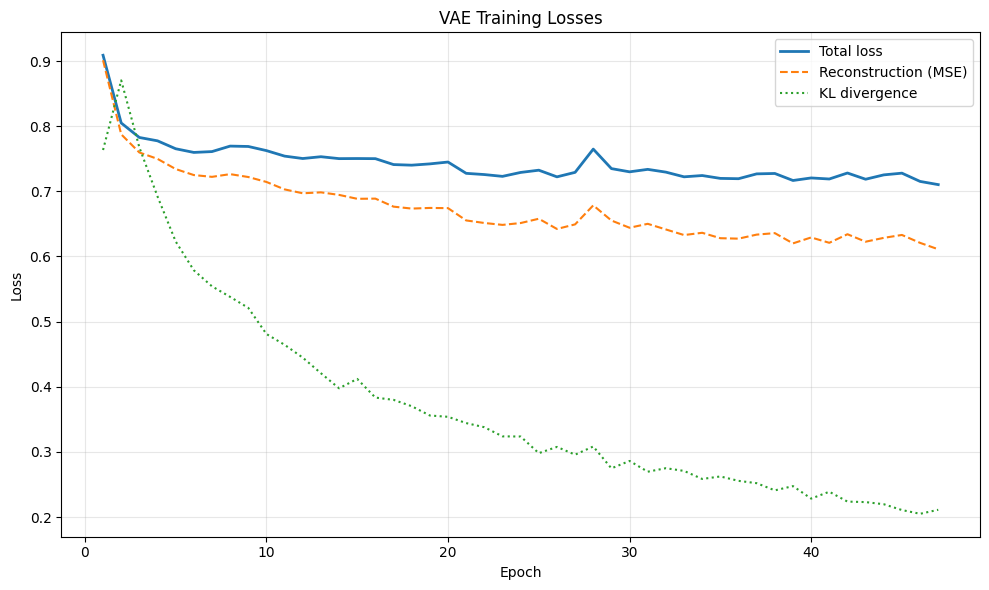

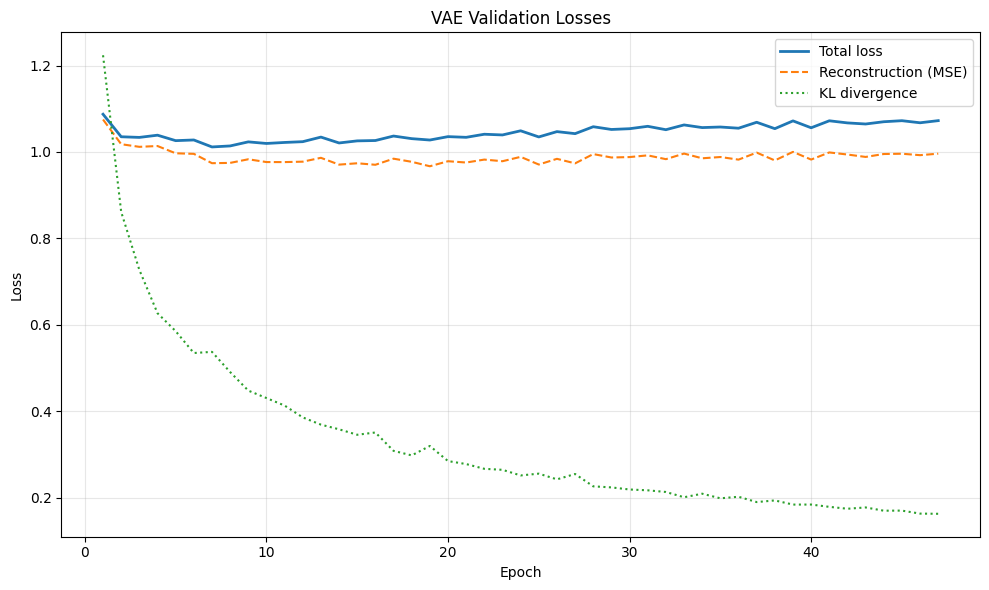

In [27]:
plot_model_metrics(my_vae, "VAE")

### t-SNE

Get latent means for all samples

In [29]:
mus_all = eval_model(my_vae, all_loader, device, use_domain=False)

Global t-SNE

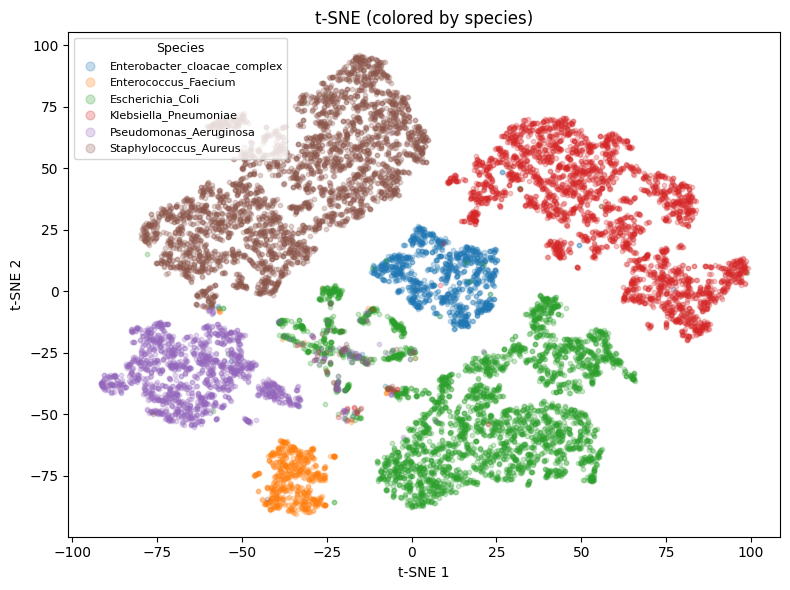

In [30]:
tsne_df = compute_tsne_df(mus_all, label_final, meta_final)
plot_tsne_global(tsne_df, False)

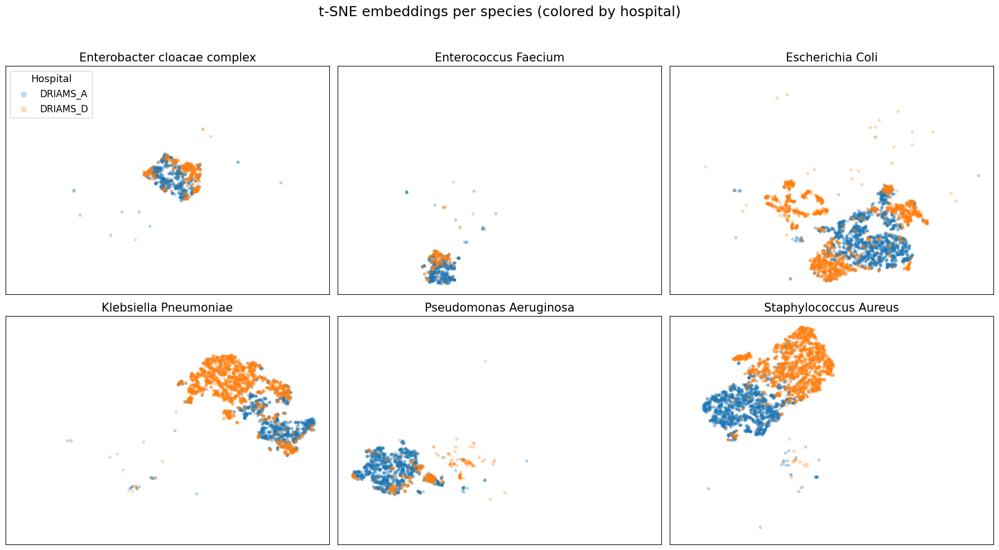

In [31]:
plot_tsne_global(tsne_df, per_species=True)

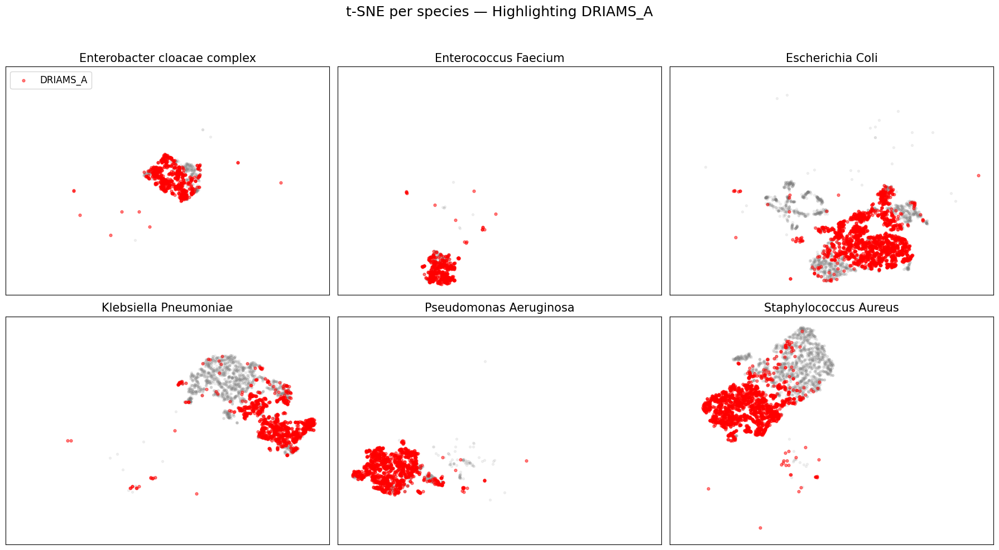

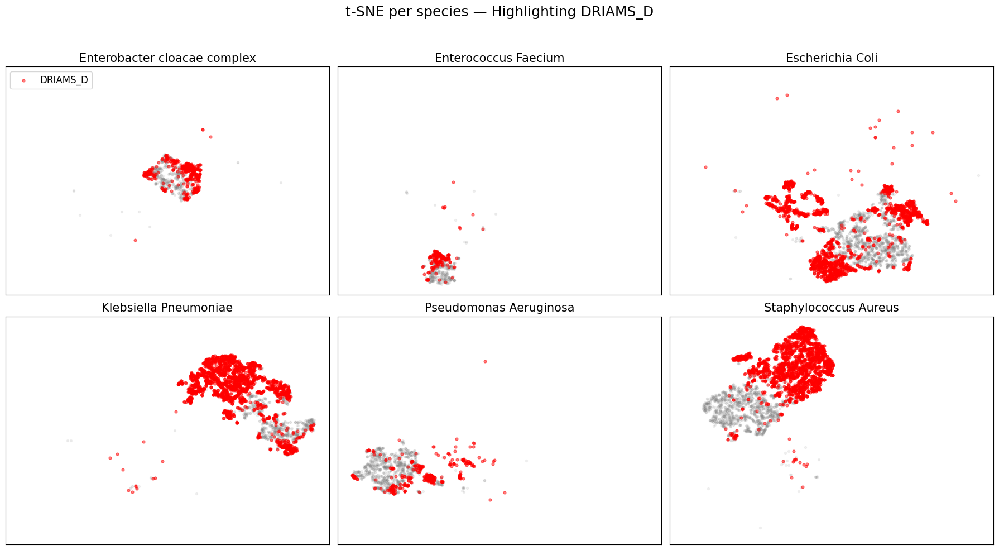

In [32]:
plot_tsne_global(tsne_df, per_species=True, overlay_per_hospital=True)


t-SNE for each species separately

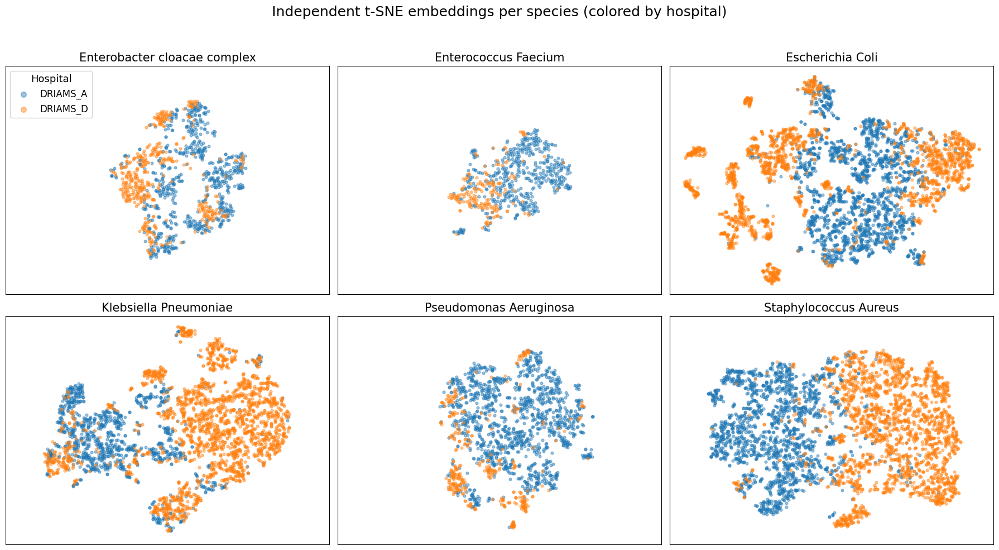

In [33]:
df_all, tsne_results = compute_tsne_per_species(mus_all, label_final, meta_final)
plot_tsne_species(df_all, tsne_results)

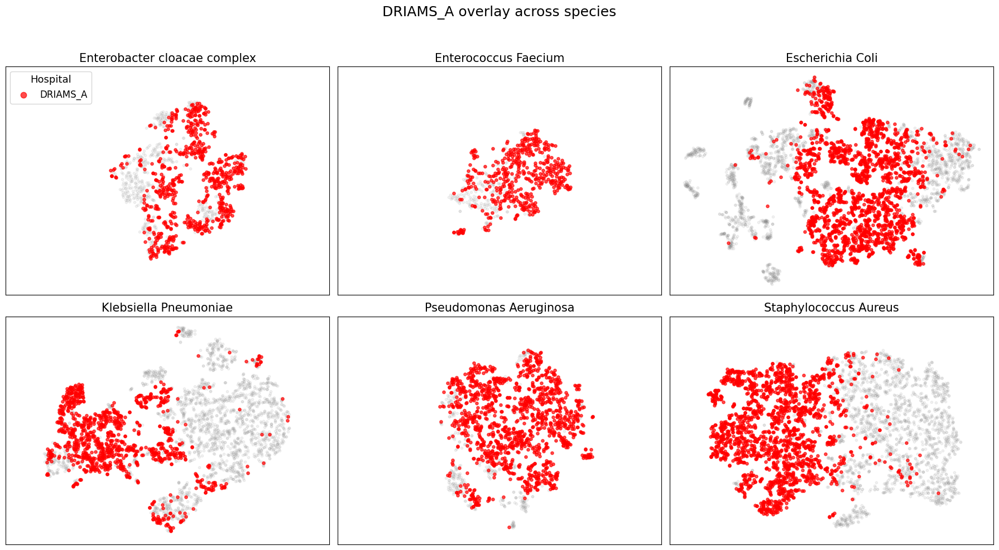

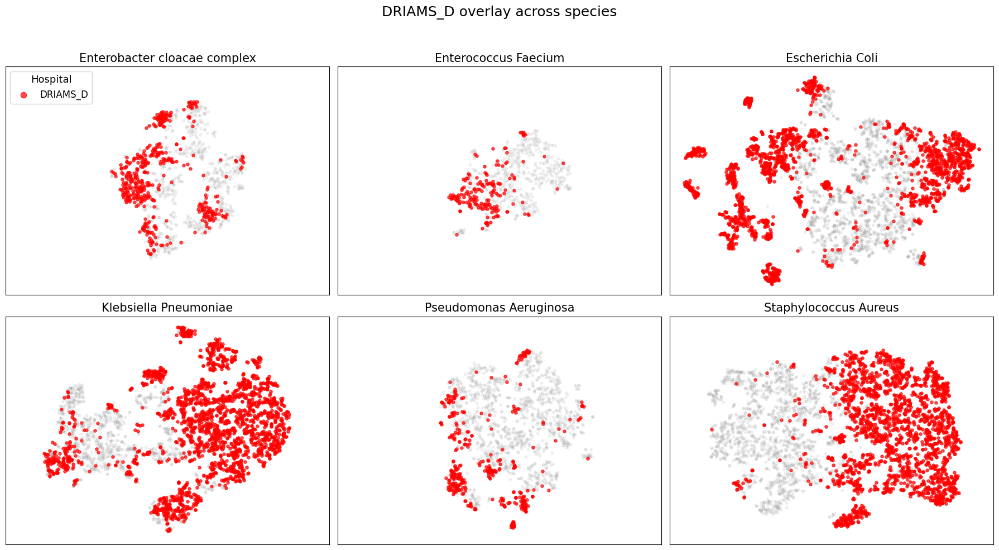

In [34]:
plot_tsne_species(df_all, tsne_results, overlay_per_hospital=True)

## VAE Multi-decoder

### Architecture

In [35]:
class MultiVAE(nn.Module):
  def __init__(self, input_dim, latent_dim, num_domains):
    super().__init__()
    self.encoder = Encoder(input_dim, latent_dim)
    self.decoder = Decoder(latent_dim, input_dim, num_domains)

  def reparameterize(self, mu, logvar):
    std = torch.exp(0.5*logvar)
    eps = torch.randn_like(std)
    return mu + eps * std

  def forward(self, x, domain_id):
    mu, logvar = self.encoder(x)
    z = self.reparameterize(mu, logvar)

    x_recon = torch.zeros_like(x)

    for d in range(len(self.decoder.net)):
        mask = (domain_id == d)
        if mask.any():
            x_recon[mask] = self.decoder.net[d](z[mask])

    return x_recon, mu, logvar

class MultiVAE_Extended(MultiVAE):
  def __init__(self, input_dim, latent_dim, num_domains, epochs=100, lr=1e-4, annealing_epochs=50, patience=20):
    super().__init__(input_dim, latent_dim, num_domains)

    self.epochs = epochs
    self.lr = lr
    self.annealing_epochs = annealing_epochs
    self.patience = patience

    self.optimizer = optim.Adam(self.parameters(), lr=self.lr, weight_decay=1e-5)
    self.criterion = nn.MSELoss()

    self.loss_during_training = []
    self.reconstruc_during_training = []
    self.KL_during_training = []

  def loss_function(self, x, x_recon, mu, logvar, beta):
    recon_loss = self.criterion(x_recon, x)
    kl_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
    total_loss = recon_loss + beta * kl_loss
    return total_loss, recon_loss, kl_loss

  def trainloop(self, trainloader, validloader, device):
    self.to(device)

    best_val_loss = float('inf')
    patience_counter = 0
    best_state = None

    for epoch in range(self.epochs):
      beta = min(1.0, (epoch + 1) / self.annealing_epochs)

      # TRAIN
      self.train()
      train_total_loss, train_recon_loss, train_kl_loss = 0, 0, 0

      for x, domain_id in trainloader:
        x = x.to(device)
        domain_id = domain_id.to(device)
        self.optimizer.zero_grad()
        x_recon, mu, logvar = self.forward(x, domain_id)
        loss, recon, kl = self.loss_function(x, x_recon, mu, logvar, beta=beta)
        loss.backward()
        self.optimizer.step()
        train_total_loss += loss.item()
        train_recon_loss += recon.item()
        train_kl_loss += kl.item()

      train_total_loss = train_total_loss / len(trainloader)
      train_recon_loss = train_recon_loss / len(trainloader)
      train_kl_loss = train_kl_loss / len(trainloader)

      # VALIDATION
      self.eval()
      val_loss, val_recon, val_kl = 0.0, 0.0, 0.0

      with torch.no_grad():
        for x, domain_id in validloader:
          x = x.to(device)
          domain_id = domain_id.to(device)
          x_recon, mu, logvar = self.forward(x, domain_id)
          loss, recon, kl = self.loss_function(x, x_recon, mu, logvar, beta=beta)
          val_loss += loss.item()
          val_recon += recon.item()
          val_kl += kl.item()

      val_loss /= len(validloader)
      val_recon /= len(validloader)
      val_kl /= len(validloader)

      self.loss_during_training.append((train_total_loss, val_loss))
      self.reconstruc_during_training.append((train_recon_loss, val_recon))
      self.KL_during_training.append((train_kl_loss, val_kl))

      if (epoch+1) % 10 == 0:
        print(f"Epoch {epoch+1}/{self.epochs} | "
              f"[Train] Loss: {train_total_loss:.4f} | Recon: {train_recon_loss:.4f} | KL: {train_kl_loss:.4f} || "
              f"[Val] Loss: {val_loss:.4f} | Recon: {val_recon:.4f} | KL: {val_kl:.4f}")

        # EARLY STOPPING
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_state = self.state_dict()
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter >= self.patience:
            print(f"Early stopping at epoch {epoch+1}")
            break

    # Restore best model
    if best_state is not None:
        self.load_state_dict(best_state)


### Training

In [36]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [37]:
my_multivae = MultiVAE_Extended(input_dim=X_train.shape[1], latent_dim=64, num_domains=2, lr=1e-4, epochs=200, annealing_epochs=100, patience=40)
my_multivae.trainloop(train_loader, val_loader, device)

Epoch 10/200 | [Train] Loss: 0.7451 | Recon: 0.7006 | KL: 0.4448 || [Val] Loss: 1.0077 | Recon: 0.9662 | KL: 0.4147
Epoch 20/200 | [Train] Loss: 0.7017 | Recon: 0.6318 | KL: 0.3496 || [Val] Loss: 1.0274 | Recon: 0.9722 | KL: 0.2756
Epoch 30/200 | [Train] Loss: 0.6908 | Recon: 0.6115 | KL: 0.2646 || [Val] Loss: 1.0320 | Recon: 0.9680 | KL: 0.2135
Epoch 40/200 | [Train] Loss: 0.6740 | Recon: 0.5839 | KL: 0.2252 || [Val] Loss: 1.0470 | Recon: 0.9737 | KL: 0.1833
Epoch 50/200 | [Train] Loss: 0.6671 | Recon: 0.5706 | KL: 0.1930 || [Val] Loss: 1.0491 | Recon: 0.9718 | KL: 0.1545
Epoch 60/200 | [Train] Loss: 0.6707 | Recon: 0.5694 | KL: 0.1688 || [Val] Loss: 1.0612 | Recon: 0.9777 | KL: 0.1392
Epoch 70/200 | [Train] Loss: 0.6611 | Recon: 0.5539 | KL: 0.1531 || [Val] Loss: 1.0712 | Recon: 0.9867 | KL: 0.1208
Epoch 80/200 | [Train] Loss: 0.6728 | Recon: 0.5646 | KL: 0.1352 || [Val] Loss: 1.0769 | Recon: 0.9864 | KL: 0.1132
Epoch 90/200 | [Train] Loss: 0.6767 | Recon: 0.5645 | KL: 0.1246 || [Val

### Plot results

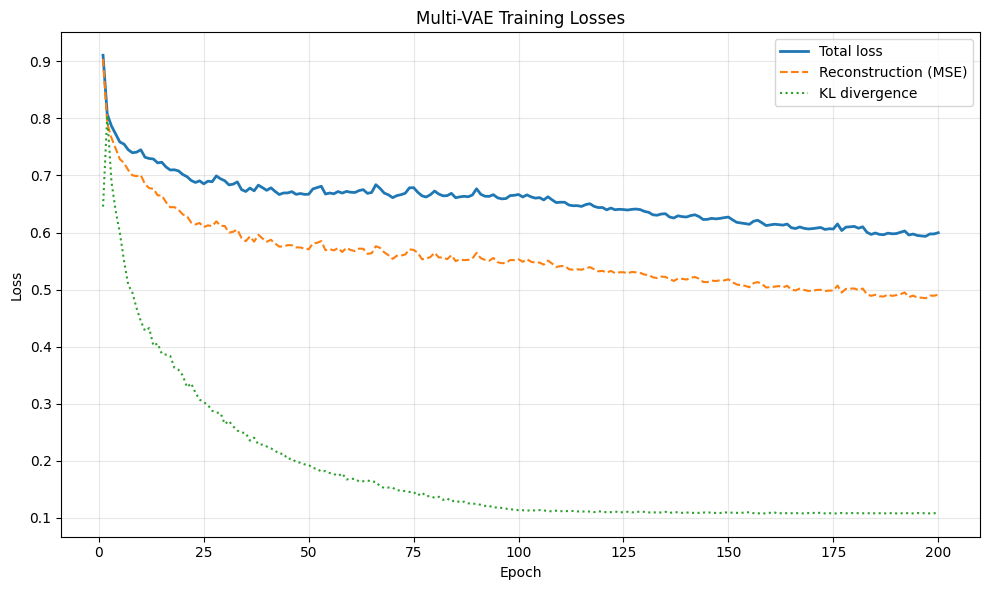

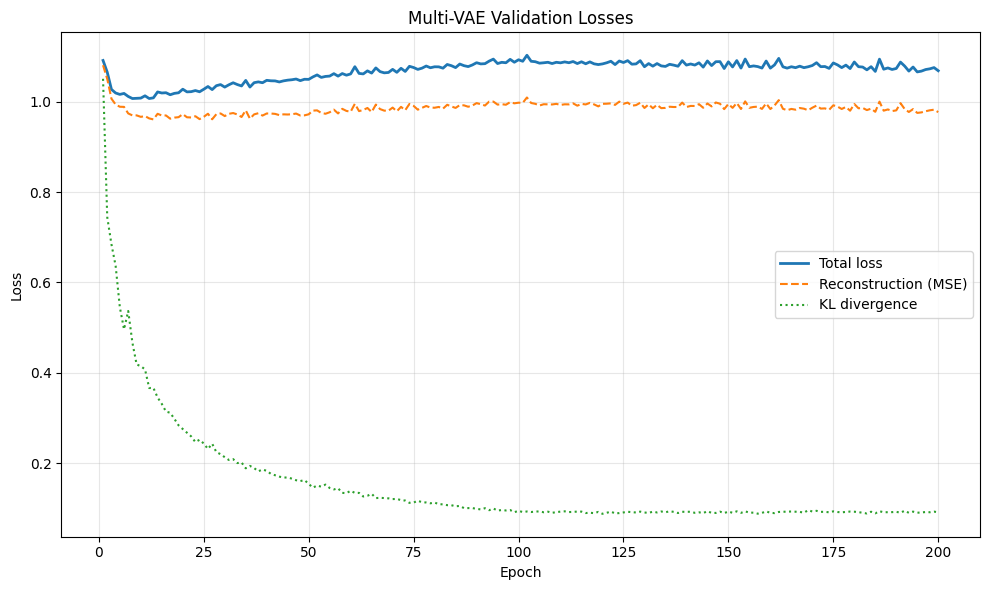

In [38]:
plot_model_metrics(my_multivae, "Multi-VAE")

### t-SNE

Get latent means for all samples

In [39]:
mus_all = eval_model(my_multivae, all_loader, device, use_domain=False)

Global t-SNE

In [40]:
tsne_df = compute_tsne_df(mus_all, label_final, meta_final)

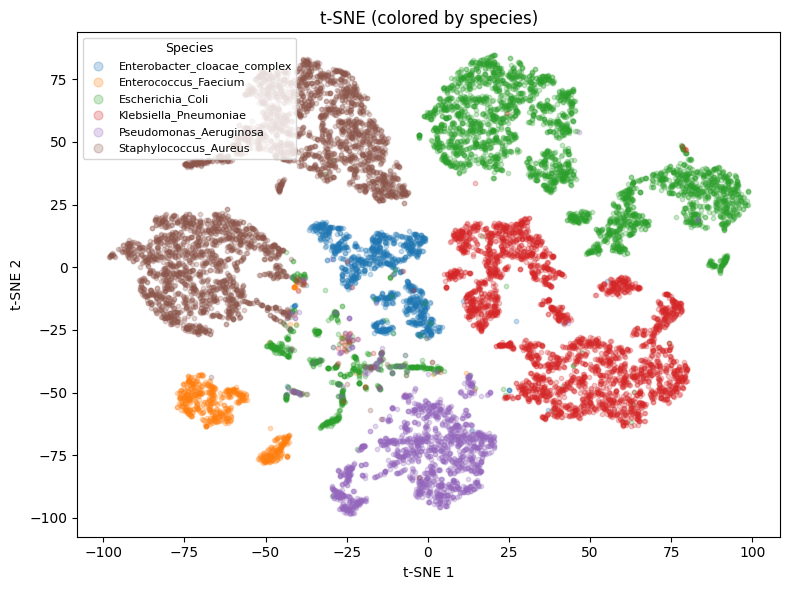

In [41]:
plot_tsne_global(tsne_df, False)

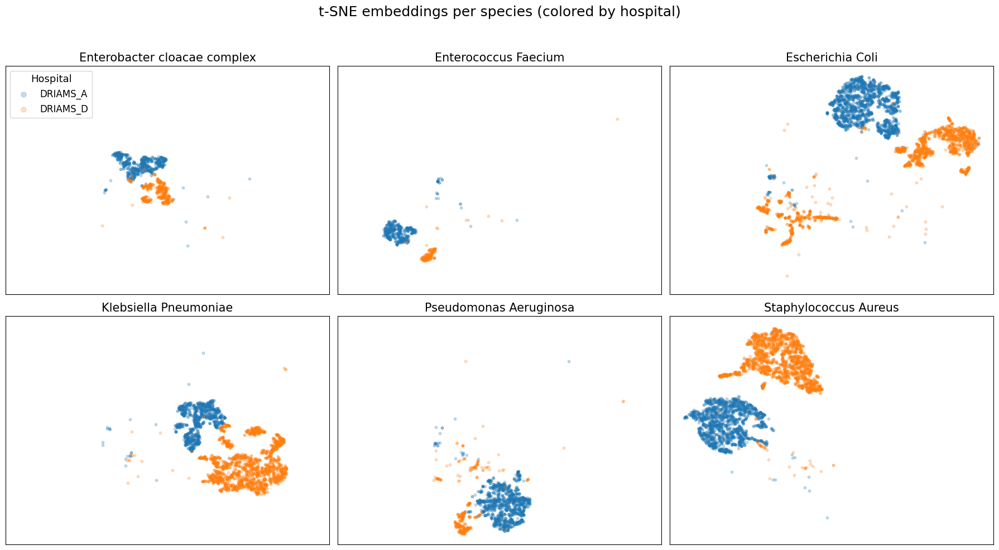

In [42]:
plot_tsne_global(tsne_df, per_species=True)

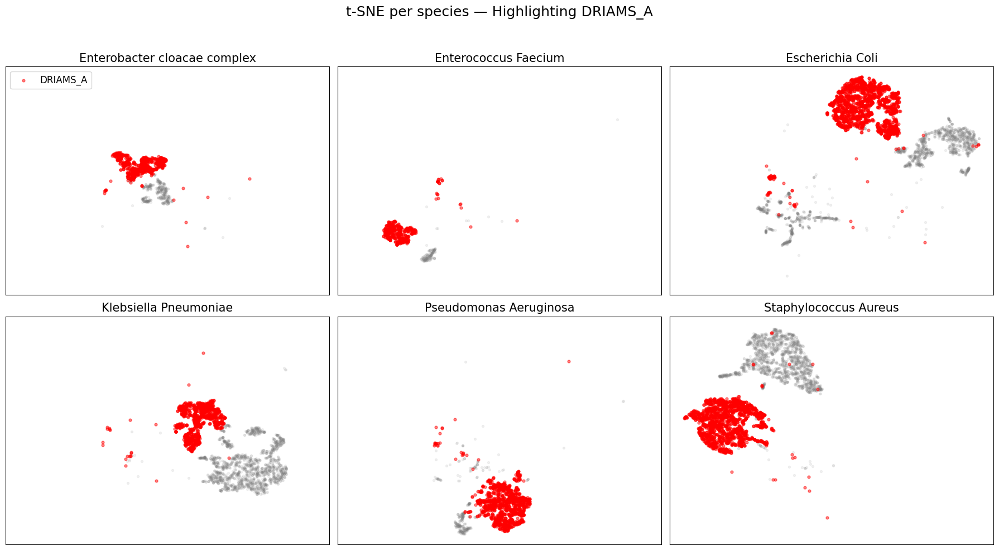

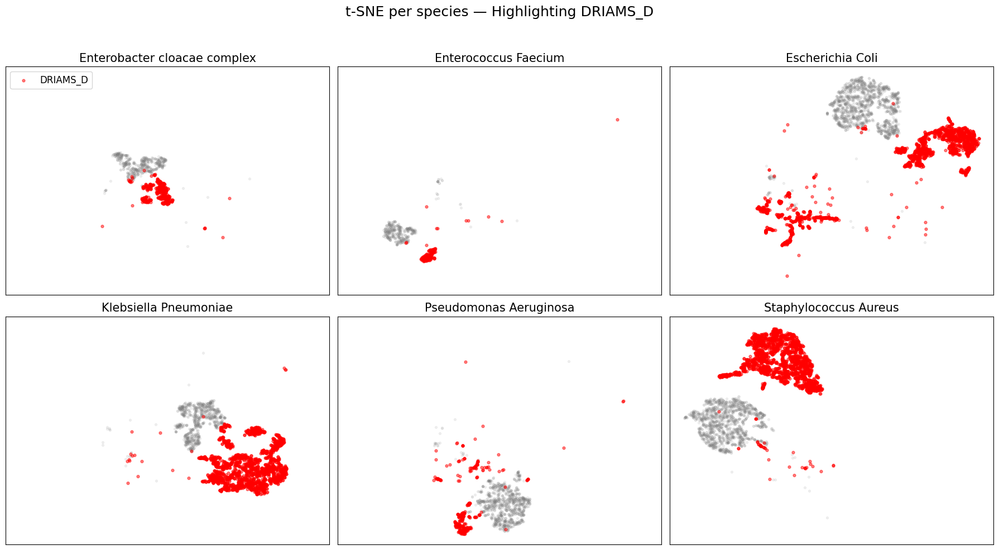

In [43]:
plot_tsne_global(tsne_df, per_species=True, overlay_per_hospital=True)

t-SNE for each species separately

In [44]:
df_all, tsne_results = compute_tsne_per_species(mus_all, label_final, meta_final)

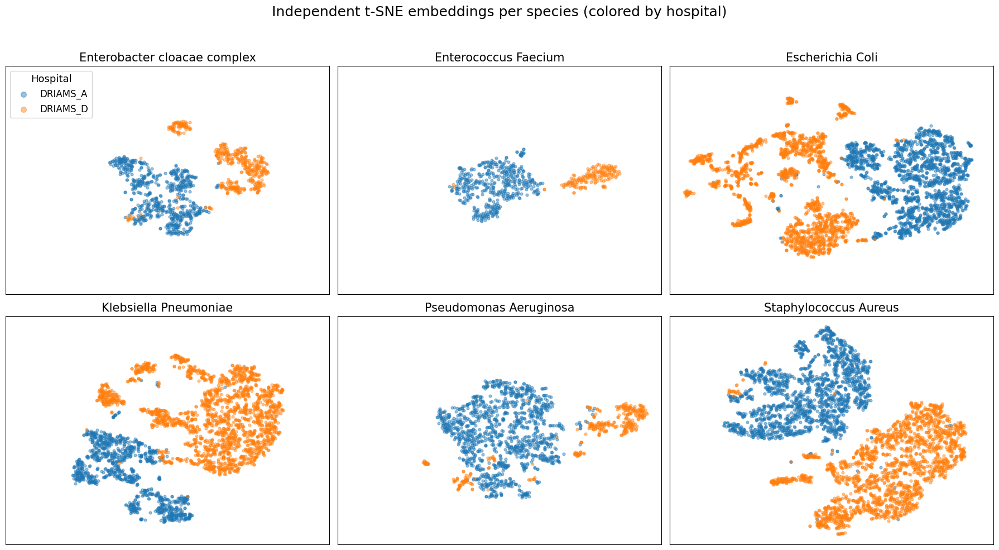

In [45]:
plot_tsne_species(df_all, tsne_results)

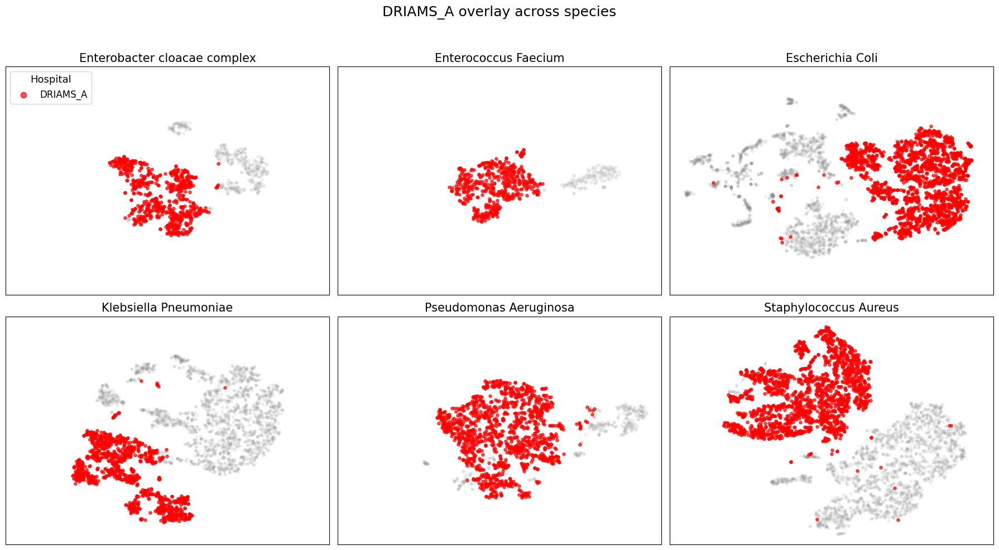

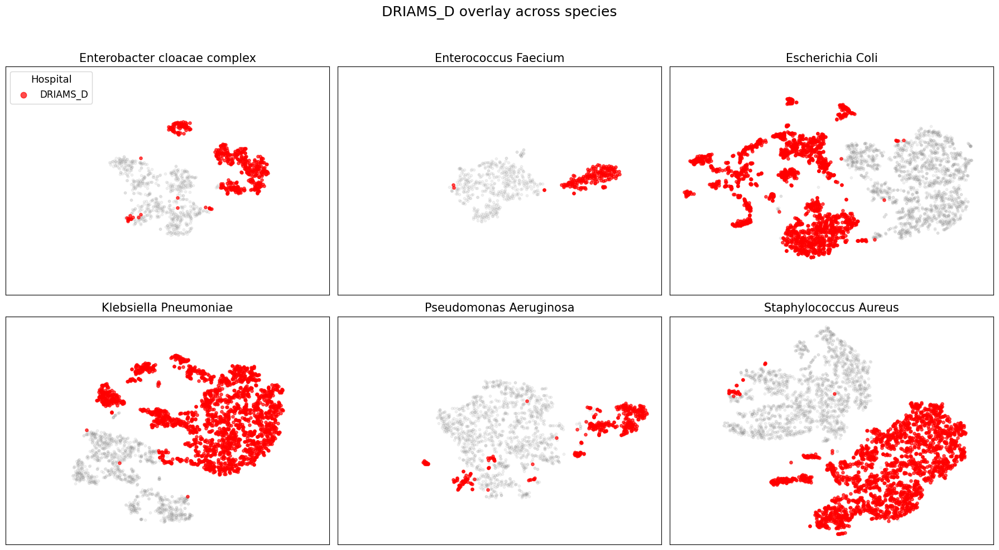

In [46]:
plot_tsne_species(df_all, tsne_results, overlay_per_hospital=True)

## VAE MultiDecoder with CORAL

### Architecture

**Discrepancia entre las matrices de covarianza**
de dos dominios \( A \) y \( B \):

$$
L_{\text{CORAL}} = \frac{1}{4d^2} \, \| C_A - C_B \|_F^2
$$

donde:  
- \( C_A \) y \( C_B \) son las **matrices de covarianza** de las representaciones latentes de cada dominio \( z_A \) y \( z_B \).  
- \( d \) es la **dimensión del espacio latente**.  
- El factor \( 4d^2 \) **normaliza la magnitud** de la pérdida.

Durante el entrenamiento, la pérdida total combina la reconstrucción del VAE con el alineamiento entre dominios:

$$
L_{\text{total}}
= L_{\text{VAE}}
+ \lambda_{\text{CORAL}} \, L_{\text{CORAL}}
$$


In [49]:
class MultiVAE_CORAL(MultiVAE):
  def __init__(self, input_dim, latent_dim, num_domains, epochs=100, lr=1e-4, annealing_epochs=50, patience=20):
    super().__init__(input_dim, latent_dim, num_domains)

    self.epochs = epochs
    self.lr = lr
    self.annealing_epochs = annealing_epochs
    self.patience = patience

    self.optimizer = optim.Adam(self.parameters(), lr=self.lr, weight_decay=1e-5)
    self.criterion = nn.MSELoss()

    self.loss_during_training = []
    self.reconstruc_during_training = []
    self.KL_during_training = []
    self.coral_loss_during_training = []

  def loss_function(self, x, x_recon, mu, logvar, beta):
    recon_loss = self.criterion(x_recon, x)
    kl_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
    total_loss = recon_loss + beta * kl_loss
    return total_loss, recon_loss, kl_loss

  def compute_coral(self, z_a, z_b):
    z_a = z_a - z_a.mean(0)
    z_b = z_b - z_b.mean(0)

    cov_a = (z_a.T @ z_a) / (z_a.shape[0]-1)
    cov_b = (z_b.T @ z_b) / (z_b.shape[0]-1)

    coral_loss = torch.mean((cov_a - cov_b)**2)
    coral_loss = coral_loss / (4*(z_a.shape[1]**2))

    return coral_loss

  def trainloop(self, trainloader, validloader, device):
    self.to(device)

    best_val_loss = float('inf')
    patience_counter = 0
    best_state = None

    for epoch in range(self.epochs):
      beta = min(1.0, (epoch + 1) / self.annealing_epochs)

      # TRAIN
      self.train()
      train_total_loss, train_recon_loss, train_kl_loss, train_coral_loss = 0, 0, 0, 0

      for x, domain_id in trainloader:
        x = x.to(device)
        domain_id = domain_id.to(device)
        self.optimizer.zero_grad()
        x_recon, mu, logvar = self.forward(x, domain_id)
        loss, recon, kl = self.loss_function(x, x_recon, mu, logvar, beta=beta)

        # CORAL
        mask_A = (domain_id == 0)
        mask_D = (domain_id == 1)
        if mask_A.any() and mask_D.any():
            z = self.reparameterize(mu, logvar)
            coral_loss = self.compute_coral(z[mask_A], z[mask_D])
            lambda_coral = 1e-3
            loss = loss + lambda_coral * coral_loss
            train_coral_loss += coral_loss.item()

        loss.backward()
        self.optimizer.step()
        train_total_loss += loss.item()
        train_recon_loss += recon.item()
        train_kl_loss += kl.item()

      train_total_loss = train_total_loss / len(trainloader)
      train_recon_loss = train_recon_loss / len(trainloader)
      train_kl_loss = train_kl_loss / len(trainloader)
      train_coral_loss = train_coral_loss / len(trainloader)

      # VALIDATION
      self.eval()
      val_loss, val_recon, val_kl, val_coral = 0, 0, 0, 0

      with torch.no_grad():
        for x, domain_id in validloader:
          x = x.to(device)
          domain_id = domain_id.to(device)
          x_recon, mu, logvar = self.forward(x, domain_id)
          loss, recon, kl = self.loss_function(x, x_recon, mu, logvar, beta=beta)

        # CORAL
          mask_A = (domain_id == 0 )
          mask_D = (domain_id == 1)
          if mask_A.any() and mask_D.any():
              z = self.reparameterize(mu, logvar)
              coral_loss = self.compute_coral(z[mask_A], z[mask_D])
              lambda_coral = 5e-3
              loss = loss + lambda_coral * coral_loss
              val_coral += coral_loss.item()

          val_loss += loss.item()
          val_recon += recon.item()
          val_kl += kl.item()

      val_loss /= len(validloader)
      val_recon /= len(validloader)
      val_kl /= len(validloader)
      val_coral /= len(validloader)

      self.loss_during_training.append((train_total_loss, val_loss))
      self.reconstruc_during_training.append((train_recon_loss, val_recon))
      self.KL_during_training.append((train_kl_loss, val_kl))
      self.coral_loss_during_training.append((train_coral_loss, val_coral))

      if (epoch+1) % 5 == 0:
        print(
          f"Epoch {epoch+1}/{self.epochs} | "
          f"[Train] Loss: {train_total_loss:.4f} | Recon: {train_recon_loss:.4f} | KL: {train_kl_loss:.4f} | CORAL: {train_coral_loss:.5f} || "
          f"[Val] Loss: {val_loss:.4f} | Recon: {val_recon:.4f} | KL: {val_kl:.4f} | CORAL: {val_coral:.5f}"
        )

      # EARLY STOPPING
      if val_loss < best_val_loss:
          best_val_loss = val_loss
          best_state = self.state_dict()
          patience_counter = 0
      else:
          patience_counter += 1

      if patience_counter >= self.patience:
          print(f"Early stopping at epoch {epoch+1}")
          break

    # Restore best model
    if best_state is not None:
        self.load_state_dict(best_state)

### Training

In [50]:
my_multivae_coral = MultiVAE_CORAL(input_dim=X_train.shape[1], latent_dim=64, num_domains=2, lr=1e-4, epochs=200, annealing_epochs=100, patience=40)
my_multivae_coral.trainloop(train_loader, val_loader, device)

Epoch 5/200 | [Train] Loss: 0.7563 | Recon: 0.7268 | KL: 0.5913 | CORAL: 0.00017 || [Val] Loss: 1.0114 | Recon: 0.9831 | KL: 0.5644 | CORAL: 0.00005
Epoch 10/200 | [Train] Loss: 0.7386 | Recon: 0.6937 | KL: 0.4481 | CORAL: 0.00011 || [Val] Loss: 1.0120 | Recon: 0.9708 | KL: 0.4115 | CORAL: 0.00002
Epoch 15/200 | [Train] Loss: 0.7404 | Recon: 0.6841 | KL: 0.3749 | CORAL: 0.00010 || [Val] Loss: 1.0176 | Recon: 0.9700 | KL: 0.3170 | CORAL: 0.00001
Epoch 20/200 | [Train] Loss: 0.7095 | Recon: 0.6393 | KL: 0.3509 | CORAL: 0.00015 || [Val] Loss: 1.0238 | Recon: 0.9678 | KL: 0.2799 | CORAL: 0.00002
Epoch 25/200 | [Train] Loss: 0.7053 | Recon: 0.6266 | KL: 0.3151 | CORAL: 0.00012 || [Val] Loss: 1.0323 | Recon: 0.9715 | KL: 0.2431 | CORAL: 0.00001
Epoch 30/200 | [Train] Loss: 0.6991 | Recon: 0.6156 | KL: 0.2783 | CORAL: 0.00009 || [Val] Loss: 1.0475 | Recon: 0.9829 | KL: 0.2155 | CORAL: 0.00001
Epoch 35/200 | [Train] Loss: 0.6991 | Recon: 0.6142 | KL: 0.2427 | CORAL: 0.00003 || [Val] Loss: 1.04

### Plot results

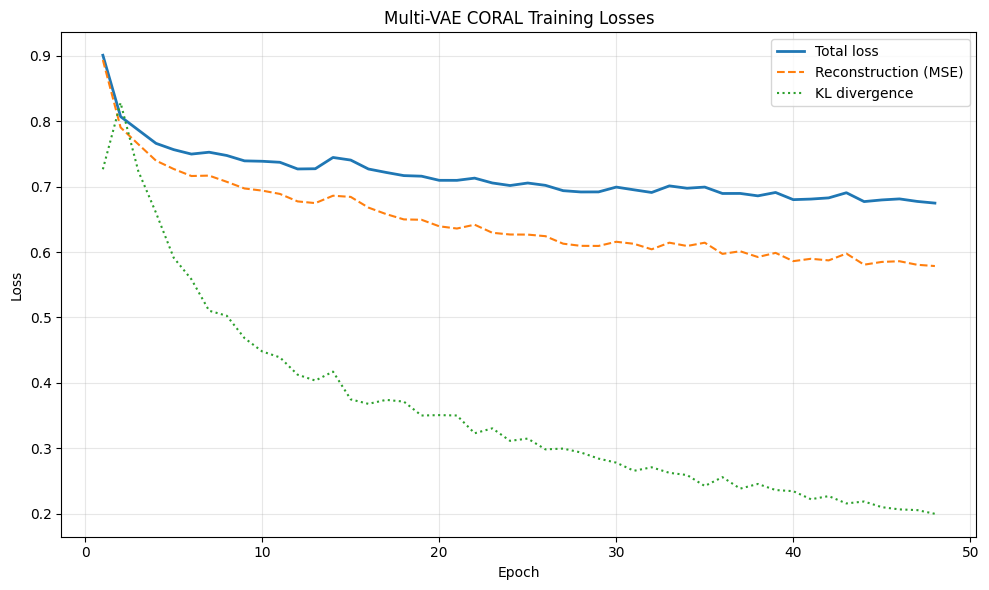

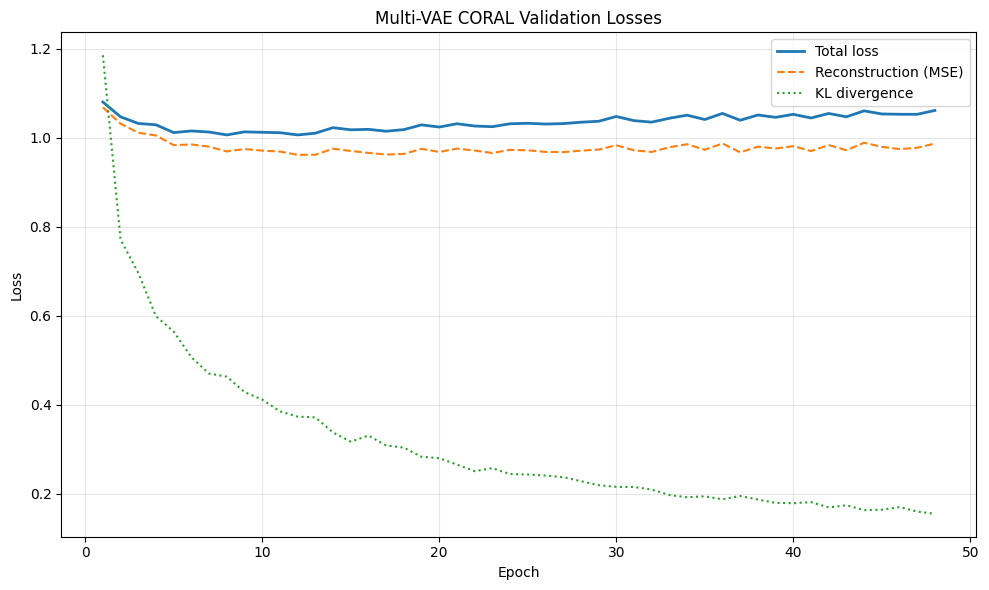

In [51]:
plot_model_metrics(my_multivae_coral, "Multi-VAE CORAL")

### t-SNE

Get latent means for all samples

In [53]:
mus_all = eval_model(my_multivae_coral, all_loader, device, use_domain=False)

Global t-SNE

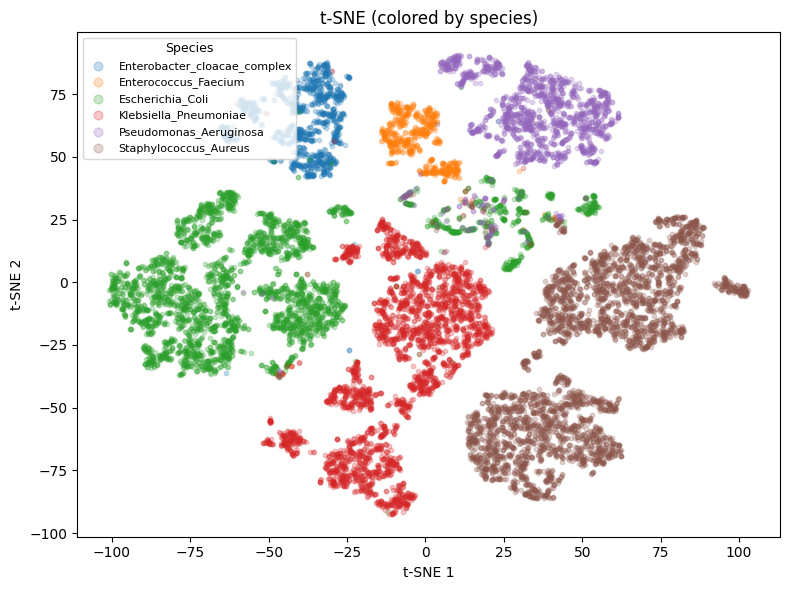

In [54]:
tsne_df = compute_tsne_df(mus_all, label_final, meta_final)
plot_tsne_global(tsne_df, False)

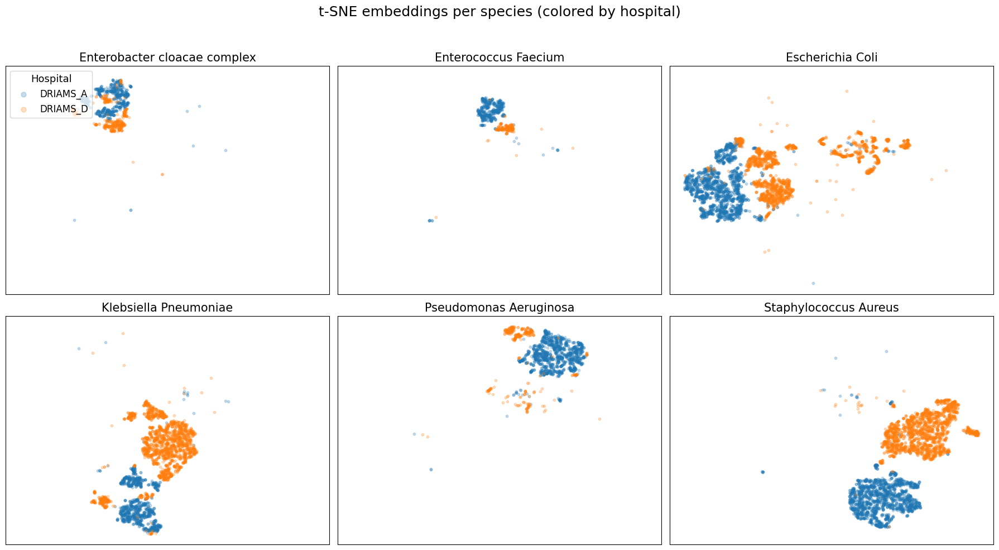

In [55]:
plot_tsne_global(tsne_df, True)

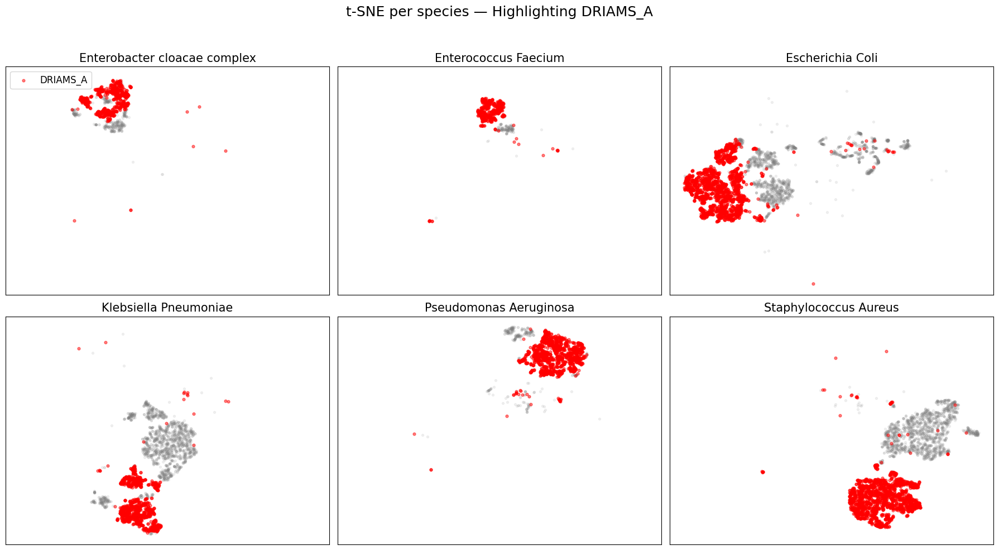

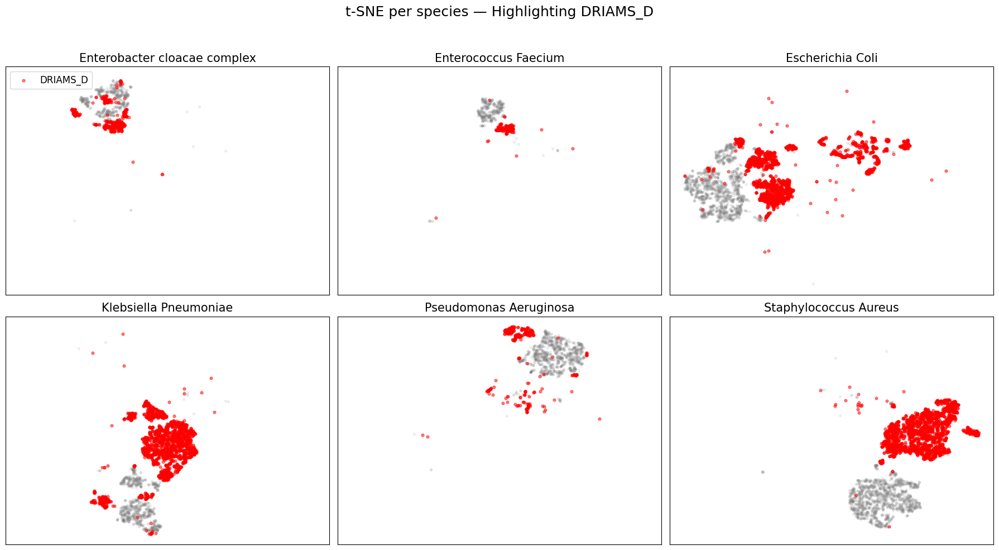

In [56]:
plot_tsne_global(tsne_df, True, True)

t-SNE for each species separately

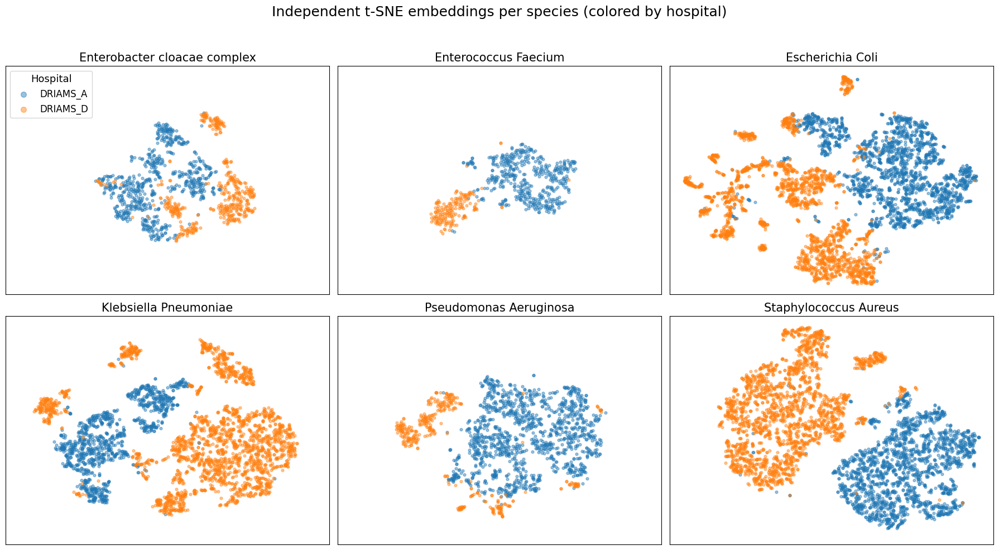

In [57]:
df_all, tsne_results = compute_tsne_per_species(mus_all, label_final, meta_final)
plot_tsne_species(df_all, tsne_results)

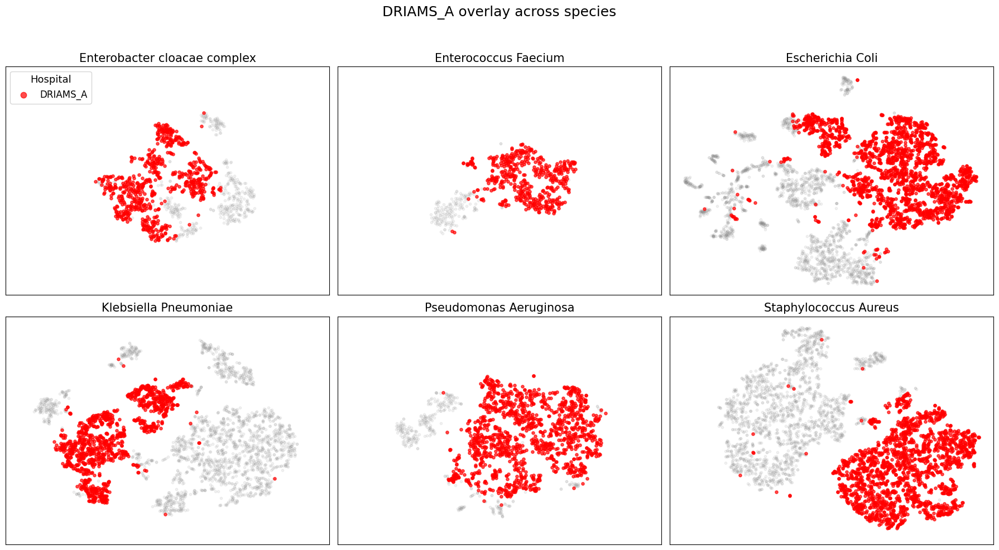

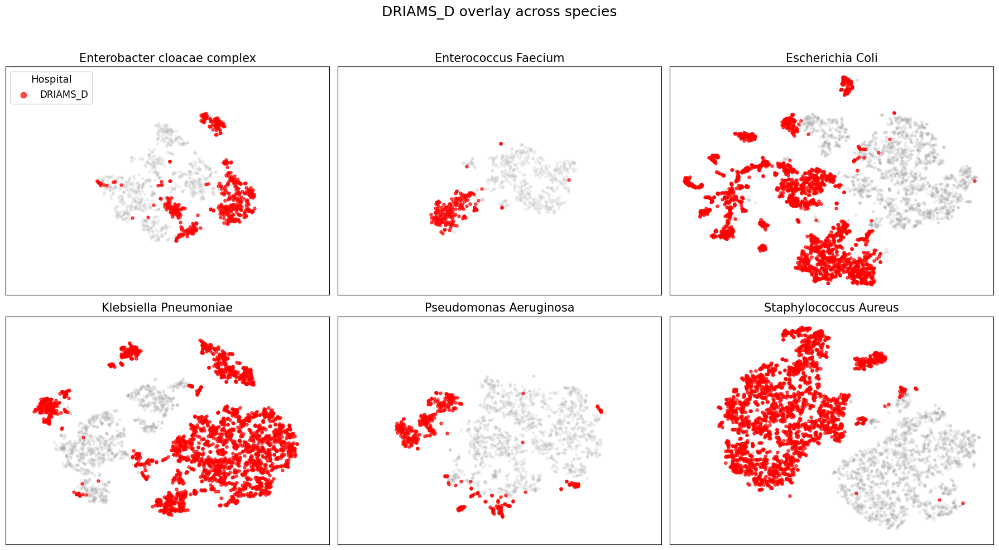

In [58]:
plot_tsne_species(df_all, tsne_results, True)

## cVAE

### Architecture

In [59]:
class ConditionalEncoder(nn.Module):
  def __init__(self, input_dim, latent_dim, cond_dim):
    super().__init__()

    self.net = nn.Sequential(
        nn.Linear(input_dim + cond_dim, 512),
        nn.ReLU(),
        nn.Linear(512, 256),
        nn.ReLU()
    )

    self.mu = nn.Linear(256, latent_dim)
    self.logvar = nn.Linear(256, latent_dim)

  def forward(self, x, c):
    h = torch.cat([x, c], dim=1)
    hidden_rep = self.net(h)
    mu = self.mu(hidden_rep)
    logvar = self.logvar(hidden_rep)
    logvar = torch.clamp(logvar, -6, 6)
    return mu, logvar

In [60]:
class ConditionalDecoder(nn.Module):
  def __init__(self, latent_dim, output_dim, cond_dim):
    super().__init__()

    self.net = nn.Sequential(
        nn.Linear(latent_dim + cond_dim, 256),
        nn.ReLU(),
        nn.Linear(256, 512),
        nn.ReLU(),
        nn.Linear(512, output_dim)
    )

  def forward(self, z, c):
    h = torch.cat([z, c], dim=1)
    x_recon = self.net(h)
    return x_recon

In [61]:
class ConditionalVAE(nn.Module):
    def __init__(self, input_dim, latent_dim, cond_dim):
        super().__init__()
        self.encoder = ConditionalEncoder(input_dim, latent_dim, cond_dim)
        self.decoder = ConditionalDecoder(latent_dim, input_dim, cond_dim)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x, c):
        mu, logvar = self.encoder(x, c)
        z = self.reparameterize(mu, logvar)
        x_recon = self.decoder(z, c)
        return x_recon, mu, logvar

In [62]:
class ConditionalVAE_Extended(ConditionalVAE):
    def __init__(self, input_dim, latent_dim, cond_dim, epochs=100, lr=1e-4, annealing_epochs=50, patience=20):
        super().__init__(input_dim, latent_dim, cond_dim)
        self.epochs = epochs
        self.lr = lr
        self.annealing_epochs = annealing_epochs
        self.patience = patience

        self.optimizer = optim.Adam(self.parameters(), lr=self.lr, weight_decay=1e-5)
        self.criterion = nn.MSELoss()

        self.loss_during_training = []
        self.reconstruc_during_training = []
        self.KL_during_training = []

    def loss_function(self, x, x_recon, mu, logvar, beta):
        recon_loss = self.criterion(x_recon, x)
        kl_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
        total_loss = recon_loss + beta * kl_loss
        return total_loss, recon_loss, kl_loss

    def trainloop(self, trainloader, validloader, device):
        self.to(device)

        best_val_loss = float('inf')
        patience_counter = 0
        best_state = None

        for epoch in range(self.epochs):
            beta = min(1.0, (epoch + 1) / self.annealing_epochs)
            self.train()
            train_total, train_recon, train_kl = 0, 0, 0

            for x, domain_id in trainloader:
                x = x.to(device)
                # One-hot encode domain
                c = nn.functional.one_hot(domain_id, num_classes=2).float().to(device)
                self.optimizer.zero_grad()
                x_recon, mu, logvar = self.forward(x, c)
                loss, recon, kl = self.loss_function(x, x_recon, mu, logvar, beta)
                loss.backward()
                self.optimizer.step()
                train_total += loss.item()
                train_recon += recon.item()
                train_kl += kl.item()

            train_total /= len(trainloader)
            train_recon /= len(trainloader)
            train_kl /= len(trainloader)

            # Validation
            self.eval()
            val_loss, val_recon, val_kl = 0, 0, 0
            with torch.no_grad():
                for x, domain_id in validloader:
                    x = x.to(device)
                    c = nn.functional.one_hot(domain_id, num_classes=2).float().to(device)
                    x_recon, mu, logvar = self.forward(x, c)
                    loss, recon, kl = self.loss_function(x, x_recon, mu, logvar, beta)
                    val_loss += loss.item()
                    val_recon += recon.item()
                    val_kl += kl.item()
            val_loss /= len(validloader)
            val_recon /= len(validloader)
            val_kl /= len(validloader)

            self.loss_during_training.append((train_total, val_loss))
            self.reconstruc_during_training.append((train_recon, val_recon))
            self.KL_during_training.append((train_kl, val_kl))

            if (epoch + 1) % 10 == 0:
                print(f"Epoch {epoch+1}/{self.epochs} | "
                      f"[Train] Loss: {train_total:.4f} | Recon: {train_recon:.4f} | KL: {train_kl:.4f} || "
                      f"[Val] Loss: {val_loss:.4f} | Recon: {val_recon:.4f} | KL: {val_kl:.4f}")

            # EARLY STOPPING
            if val_loss < best_val_loss:
                best_val_loss = val_loss
                best_state = self.state_dict()
                patience_counter = 0
            else:
                patience_counter += 1

            if patience_counter >= self.patience:
                print(f"Early stopping at epoch {epoch+1}")
                break

        # Restore best model
        if best_state is not None:
            self.load_state_dict(best_state)

### Training

In [63]:
my_cvae = ConditionalVAE_Extended(
    input_dim=X_train.shape[1],
    latent_dim=64,
    cond_dim=2,
    epochs=200,
    annealing_epochs=100,
    patience=40
).to(device)

In [64]:
my_cvae.trainloop(train_loader, val_loader, device)

Epoch 10/200 | [Train] Loss: 0.7738 | Recon: 0.7388 | KL: 0.3500 || [Val] Loss: 1.0304 | Recon: 0.9938 | KL: 0.3653
Epoch 20/200 | [Train] Loss: 0.7606 | Recon: 0.7090 | KL: 0.2578 || [Val] Loss: 1.0322 | Recon: 0.9850 | KL: 0.2364
Epoch 30/200 | [Train] Loss: 0.7495 | Recon: 0.6846 | KL: 0.2165 || [Val] Loss: 1.0516 | Recon: 0.9959 | KL: 0.1857
Epoch 40/200 | [Train] Loss: 0.7351 | Recon: 0.6629 | KL: 0.1804 || [Val] Loss: 1.0482 | Recon: 0.9856 | KL: 0.1564
Epoch 50/200 | [Train] Loss: 0.7267 | Recon: 0.6472 | KL: 0.1591 || [Val] Loss: 1.0556 | Recon: 0.9864 | KL: 0.1384
Early stopping at epoch 52


### Plot results

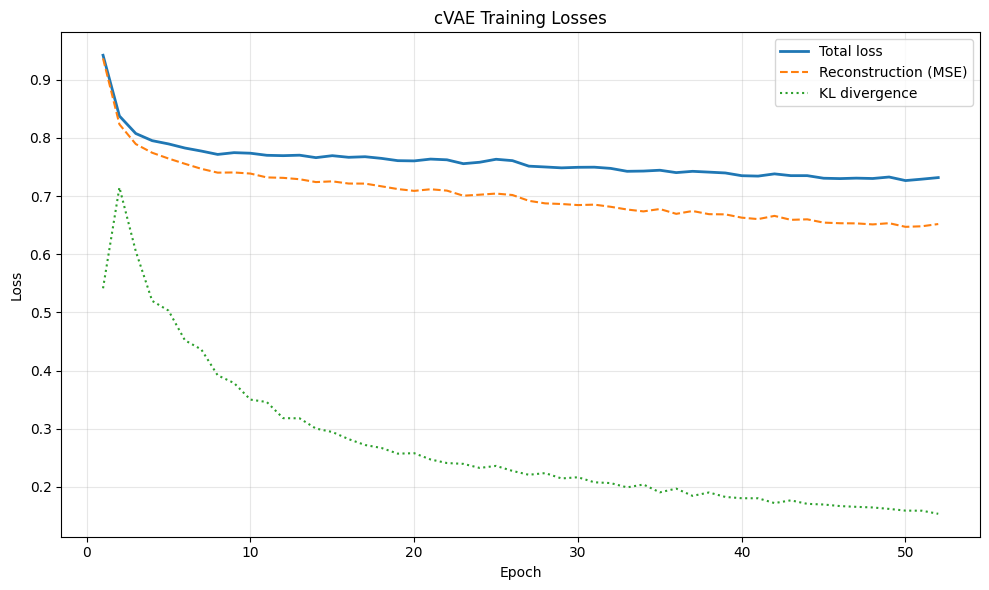

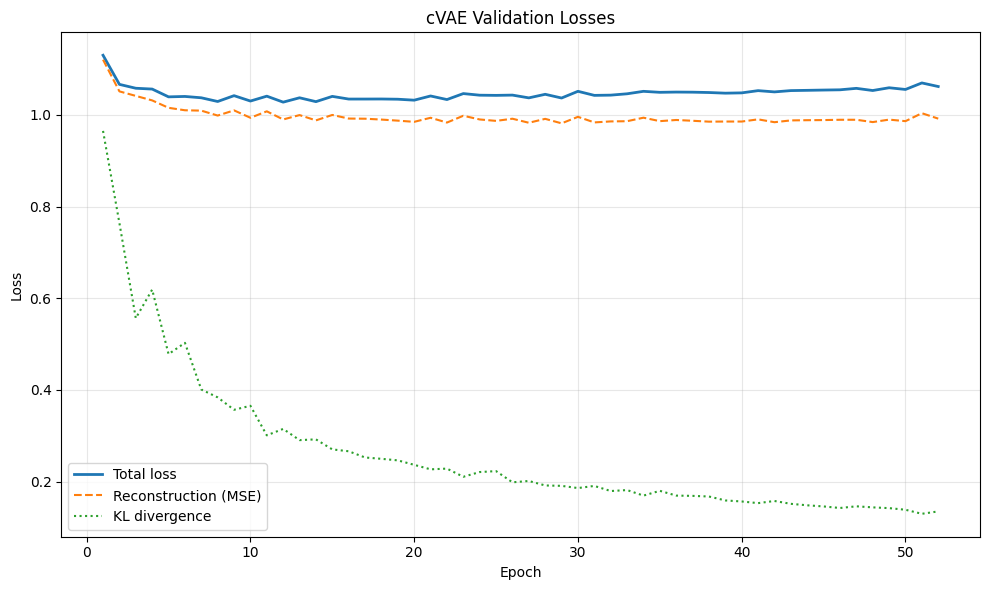

In [66]:
plot_model_metrics(my_cvae, "cVAE")

### t-SNE

Get latent means for all samples

In [67]:
mus_all = eval_model(my_cvae, all_loader, device, use_domain=True)

Global t-SNE

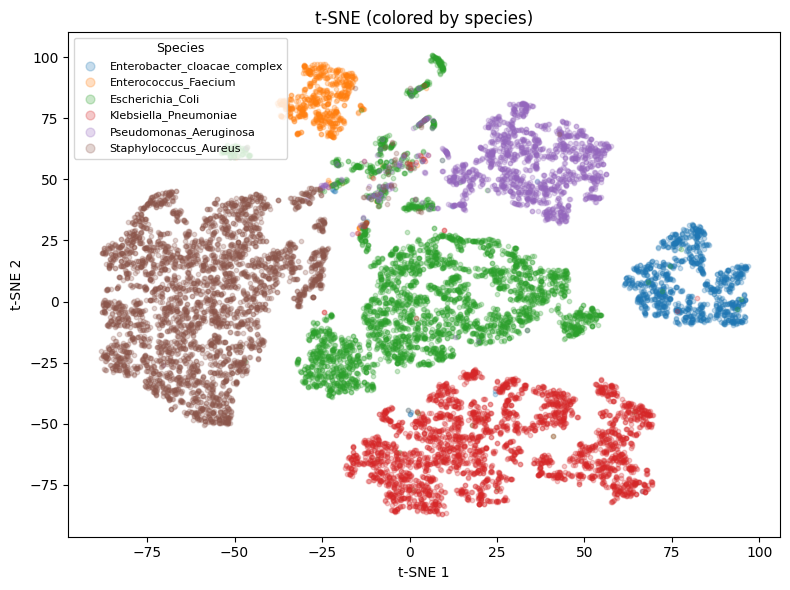

In [68]:
tsne_df = compute_tsne_df(mus_all, label_final, meta_final)
plot_tsne_global(tsne_df, False)

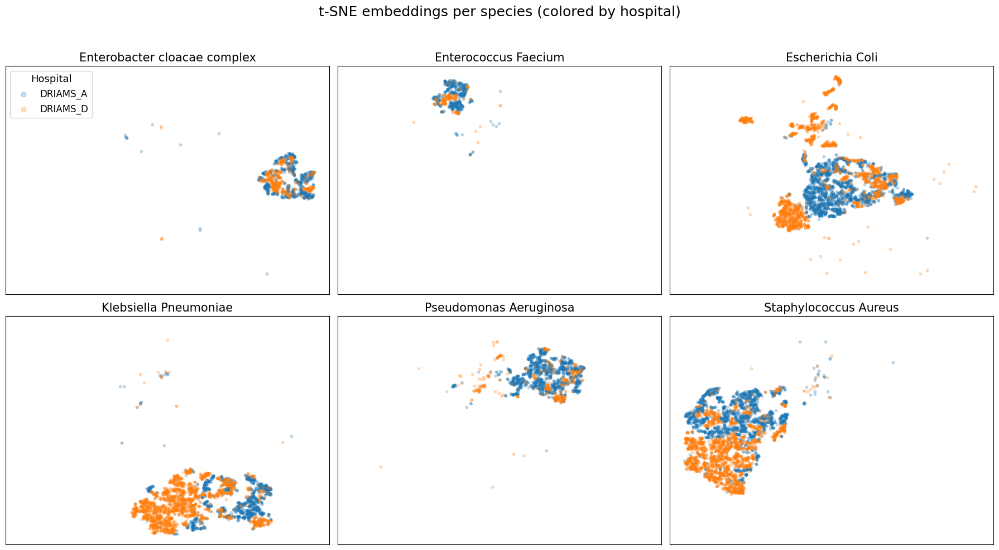

In [69]:
plot_tsne_global(tsne_df, True)

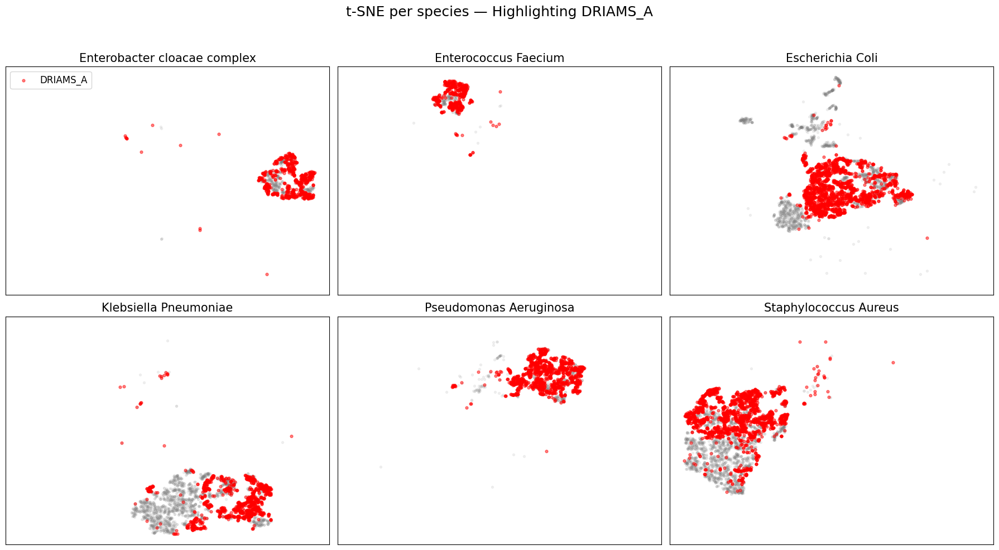

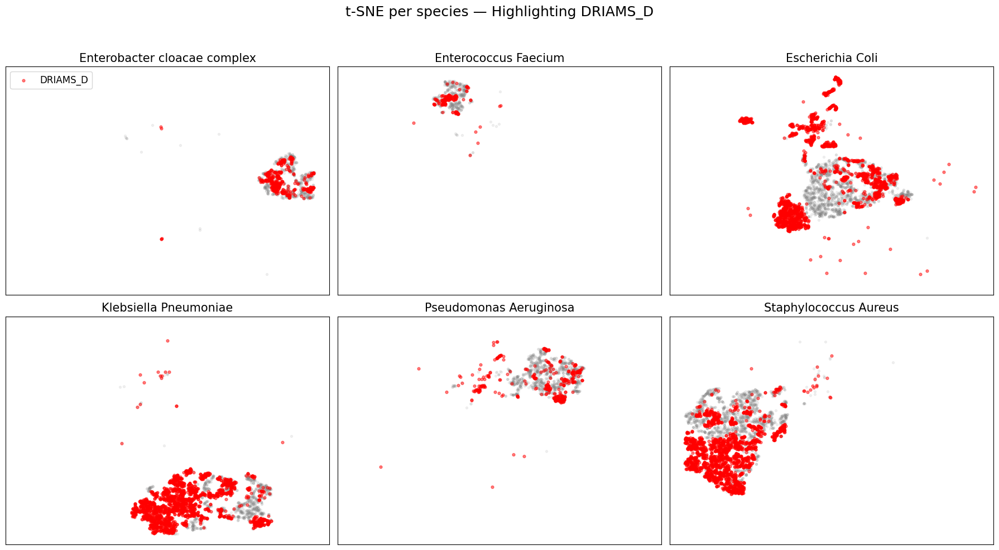

In [70]:
plot_tsne_global(tsne_df, True, True)

t-SNE for each species separately

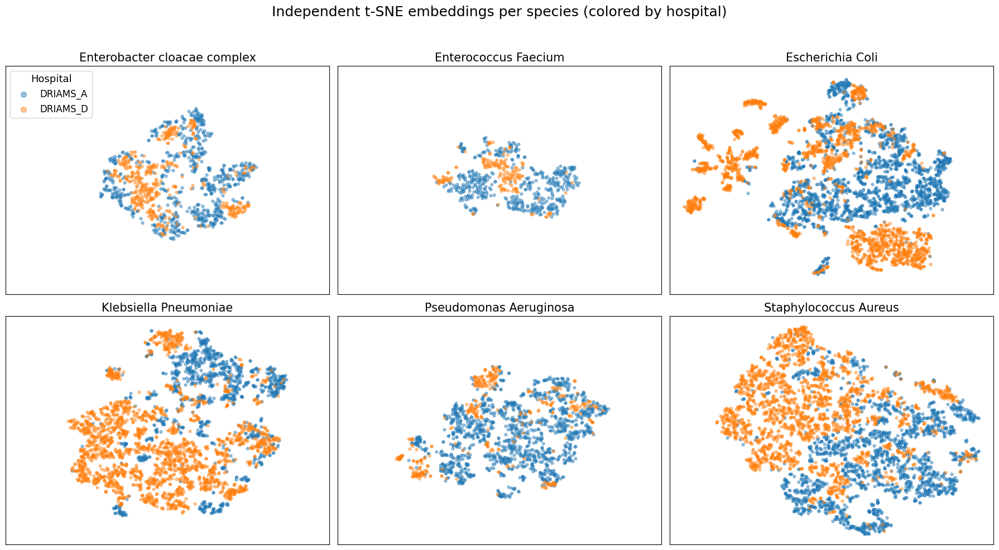

In [71]:
df_all, tsne_results = compute_tsne_per_species(mus_all, label_final, meta_final)
plot_tsne_species(df_all, tsne_results)

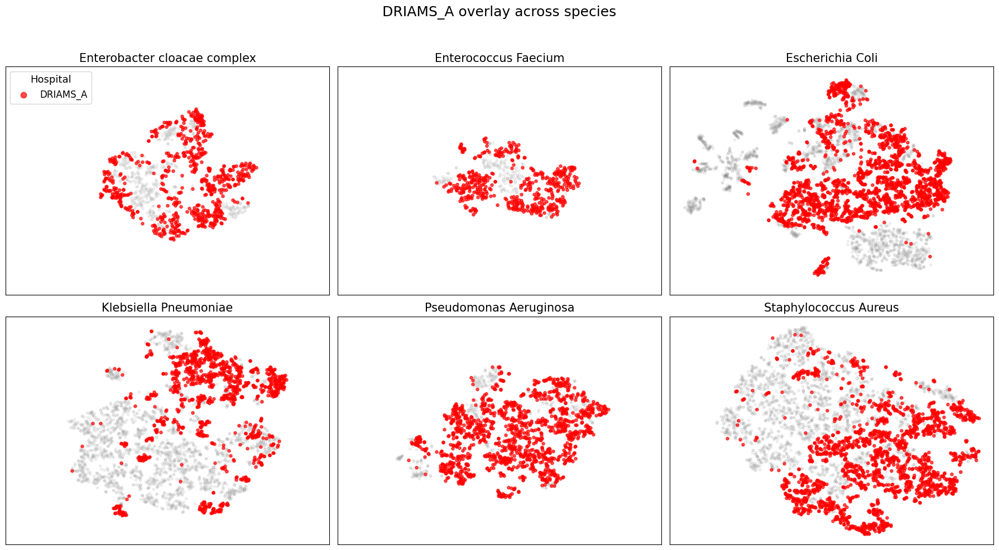

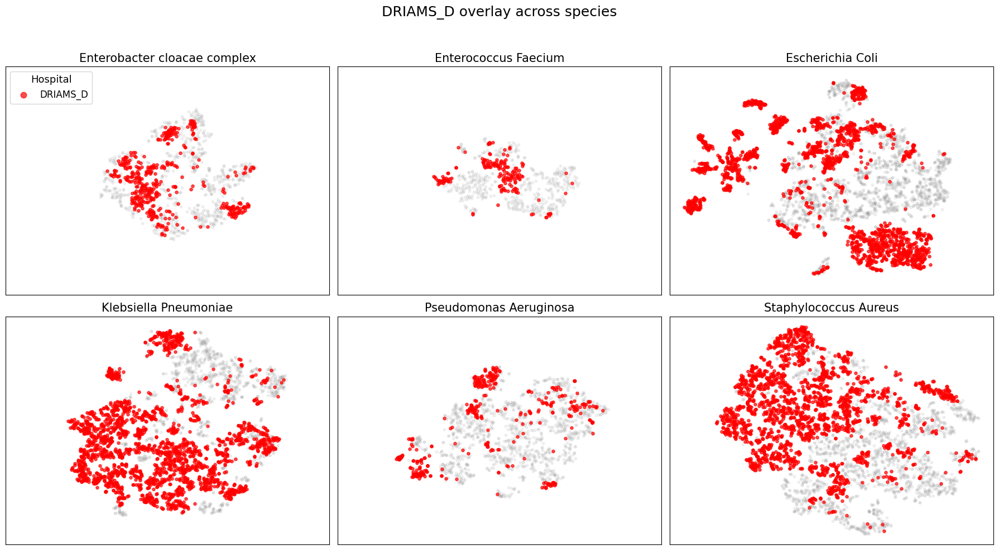

In [72]:
plot_tsne_species(df_all, tsne_results, True)

## cVAE w/o domain in encoder

### Architecture

In [73]:
class InvariantCVAE(nn.Module):
    def __init__(self, input_dim, latent_dim, cond_dim):
        super().__init__()
        self.encoder = Encoder(input_dim, latent_dim)
        self.decoder = ConditionalDecoder(latent_dim, input_dim, cond_dim)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x, c):
        mu, logvar = self.encoder(x)
        z = self.reparameterize(mu, logvar)
        x_recon = self.decoder(z, c)
        return x_recon, mu, logvar

class InvariantCVAE_Extended(InvariantCVAE):
    def __init__(self, input_dim, latent_dim, cond_dim, epochs=100, lr=1e-4, annealing_epochs=50, patience=20):
        super().__init__(input_dim, latent_dim, cond_dim)
        self.epochs = epochs
        self.lr = lr
        self.annealing_epochs = annealing_epochs
        self.patience = patience

        self.optimizer = optim.Adam(self.parameters(), lr=self.lr, weight_decay=1e-5)
        self.criterion = nn.MSELoss()

        self.loss_during_training = []
        self.reconstruc_during_training = []
        self.KL_during_training = []

    def loss_function(self, x, x_recon, mu, logvar, beta):
        recon_loss = self.criterion(x_recon, x)
        kl_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
        total_loss = recon_loss + beta * kl_loss
        return total_loss, recon_loss, kl_loss

    def trainloop(self, trainloader, validloader, device):
        self.to(device)

        best_val_loss = float('inf')
        patience_counter = 0
        best_state = None

        for epoch in range(self.epochs):
            beta = min(1.0, (epoch + 1) / self.annealing_epochs)
            self.train()
            train_total, train_recon, train_kl = 0, 0, 0

            for x, domain_id in trainloader:
                x = x.to(device)
                # One-hot encode domain
                c = nn.functional.one_hot(domain_id, num_classes=2).float().to(device)
                self.optimizer.zero_grad()
                x_recon, mu, logvar = self.forward(x, c)
                loss, recon, kl = self.loss_function(x, x_recon, mu, logvar, beta)
                loss.backward()
                self.optimizer.step()
                train_total += loss.item()
                train_recon += recon.item()
                train_kl += kl.item()

            train_total /= len(trainloader)
            train_recon /= len(trainloader)
            train_kl /= len(trainloader)

            # Validation
            self.eval()
            val_loss, val_recon, val_kl = 0, 0, 0
            with torch.no_grad():
                for x, domain_id in validloader:
                    x = x.to(device)
                    c = nn.functional.one_hot(domain_id, num_classes=2).float().to(device)
                    x_recon, mu, logvar = self.forward(x, c)
                    loss, recon, kl = self.loss_function(x, x_recon, mu, logvar, beta)
                    val_loss += loss.item()
                    val_recon += recon.item()
                    val_kl += kl.item()
            val_loss /= len(validloader)
            val_recon /= len(validloader)
            val_kl /= len(validloader)

            self.loss_during_training.append((train_total, val_loss))
            self.reconstruc_during_training.append((train_recon, val_recon))
            self.KL_during_training.append((train_kl, val_kl))

            if (epoch + 1) % 10 == 0:
                print(f"Epoch {epoch+1}/{self.epochs} | "
                      f"[Train] Loss: {train_total:.4f} | Recon: {train_recon:.4f} | KL: {train_kl:.4f} || "
                      f"[Val] Loss: {val_loss:.4f} | Recon: {val_recon:.4f} | KL: {val_kl:.4f}")

            # EARLY STOPPING
            if val_loss < best_val_loss:
                best_val_loss = val_loss
                best_state = self.state_dict()
                patience_counter = 0
            else:
                patience_counter += 1

            if patience_counter >= self.patience:
                print(f"Early stopping at epoch {epoch+1}")
                break

        # Restore best model
        if best_state is not None:
            self.load_state_dict(best_state)


### Training

In [74]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [75]:
my_invariant_cvae = InvariantCVAE_Extended(
    input_dim=X_train.shape[1],
    latent_dim=64,
    cond_dim=2,
    epochs=200,
    annealing_epochs=100,
    patience=40
).to(device)

In [76]:
my_invariant_cvae.trainloop(train_loader, val_loader, device)

Epoch 10/200 | [Train] Loss: 0.7756 | Recon: 0.7365 | KL: 0.3912 || [Val] Loss: 1.0372 | Recon: 1.0025 | KL: 0.3467
Epoch 20/200 | [Train] Loss: 0.7711 | Recon: 0.7179 | KL: 0.2659 || [Val] Loss: 1.0340 | Recon: 0.9841 | KL: 0.2493
Epoch 30/200 | [Train] Loss: 0.7565 | Recon: 0.6875 | KL: 0.2303 || [Val] Loss: 1.0516 | Recon: 0.9944 | KL: 0.1908
Epoch 40/200 | [Train] Loss: 0.7424 | Recon: 0.6654 | KL: 0.1926 || [Val] Loss: 1.0576 | Recon: 0.9960 | KL: 0.1540
Epoch 50/200 | [Train] Loss: 0.7344 | Recon: 0.6507 | KL: 0.1674 || [Val] Loss: 1.0610 | Recon: 0.9924 | KL: 0.1373
Early stopping at epoch 56


### Plot results

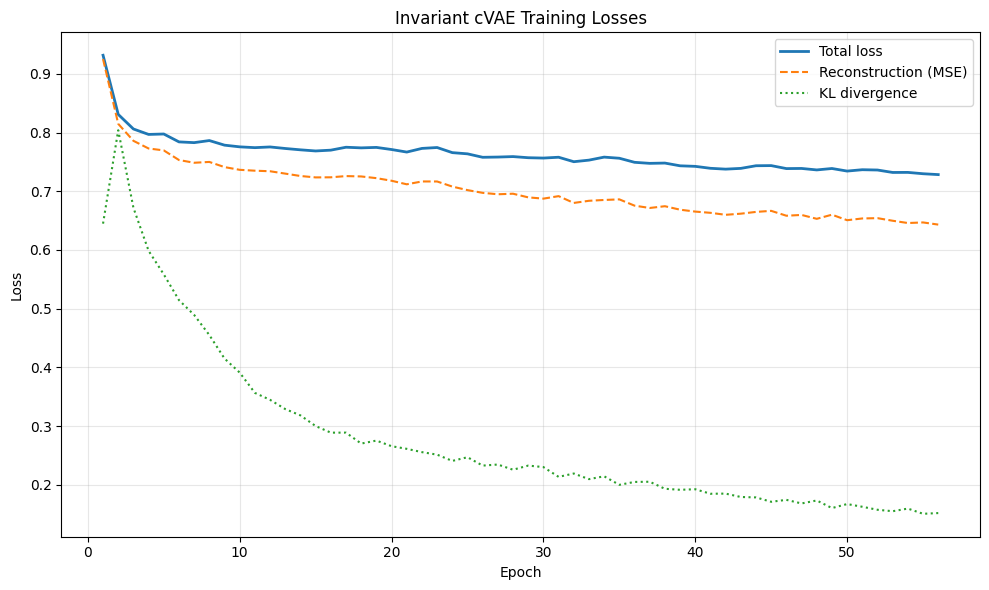

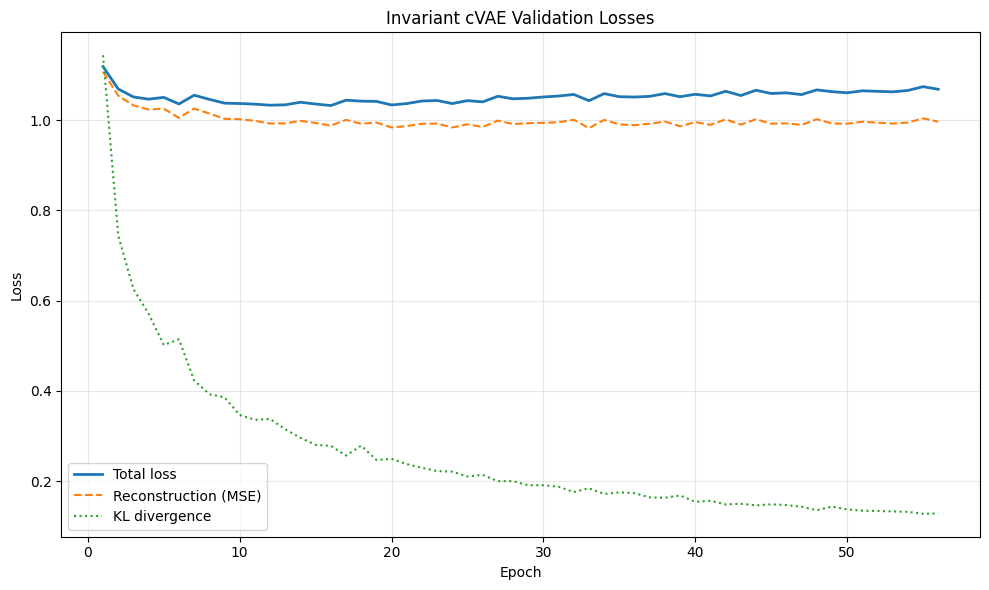

In [77]:
plot_model_metrics(my_invariant_cvae, "Invariant cVAE")

### t-SNE

Get latent means for all samples

In [78]:
mus_all = eval_model(my_invariant_cvae, all_loader, device, use_domain=False)

Global t-SNE

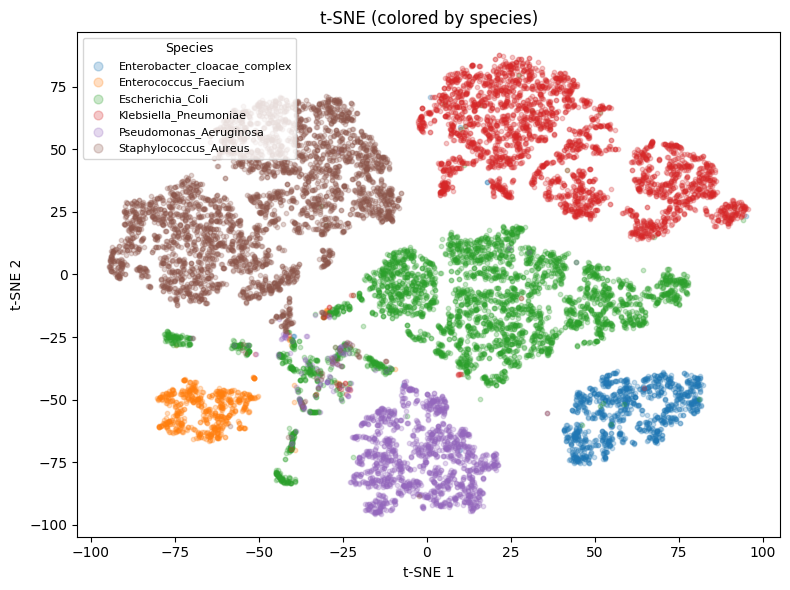

In [79]:
tsne_df = compute_tsne_df(mus_all, label_final, meta_final)
plot_tsne_global(tsne_df, False)

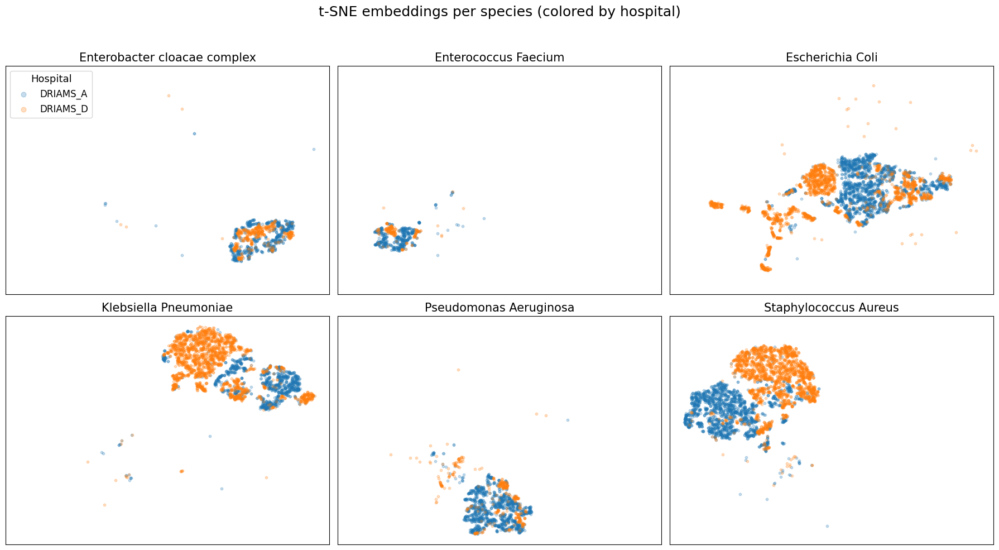

In [80]:
plot_tsne_global(tsne_df, True)

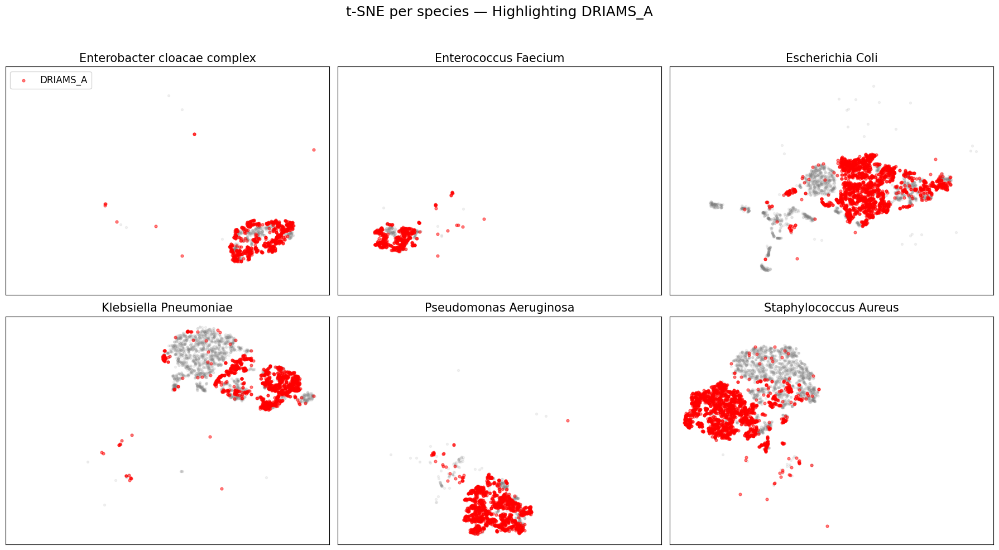

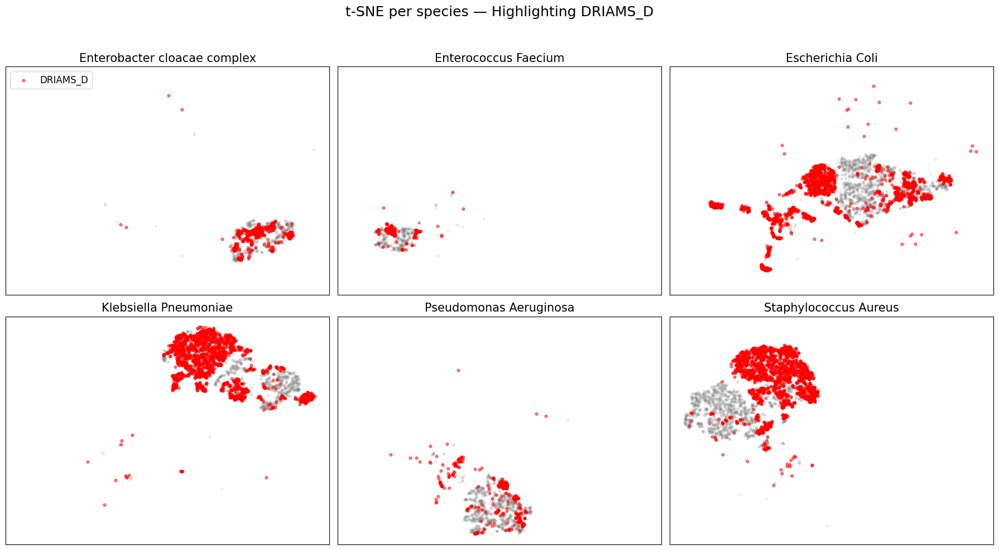

In [81]:
plot_tsne_global(tsne_df, True, True)

t-SNE for each species separately

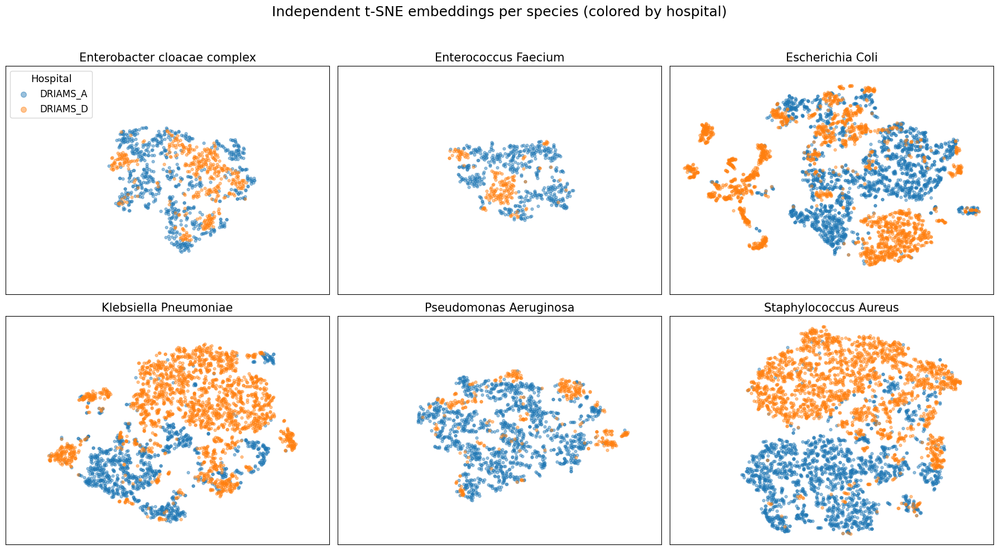

In [82]:
df_all, tsne_results = compute_tsne_per_species(mus_all, label_final, meta_final)
plot_tsne_species(df_all, tsne_results)

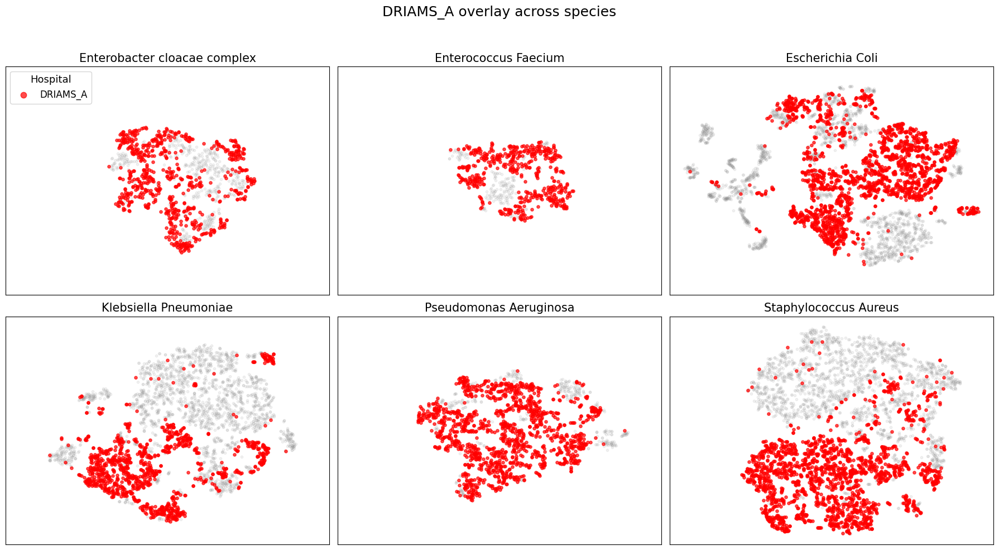

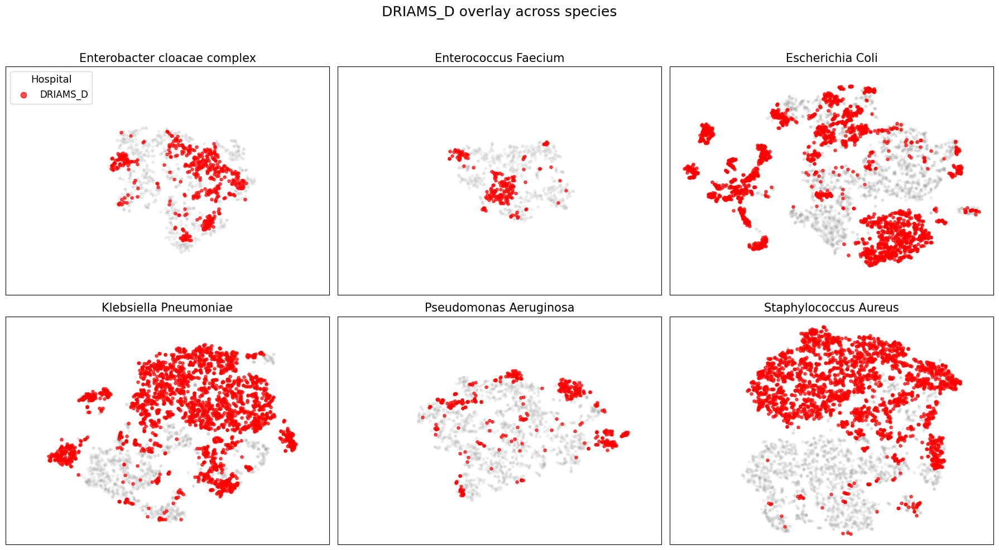

In [83]:
plot_tsne_species(df_all, tsne_results, True)